<a href="https://colab.research.google.com/github/Chia-Tien-Tang/Deep-Learning-in-Practice_Assignment/blob/main/TP6/TP6_generative_models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Generative modelling in deep learning

*This notebook consists of common introductory questions, followed by 4 different generative models, and a common conclusive question. **Choose & implement 2 among the 4 models**, not all of them! If you train more models, write down below the 2 ones you want to be graded on. Do not forget the last common question.*

Generative modelling in machine learning can aim at achieving different goals.

The first, obvious one is that a generative model can be used to generate more data, to be used afterwards by another algorithm. While a generative model cannot create more information to solve the issue of having too small datasets, it could be used to solve anonymity questions. Typically, sharing a generative model trained on private data could allow the exploitation of the statistical property of this data without sharing the data itself (which can be protected by privacy matters for example).

Another goal is to use generative modelling to better understand the data at hand. This is based on the hypothesis that a model that successfully learned to generate (and generalize) a dataset should have internally learned some efficient and compressed representation of the information contained in the data. In this case, analysing a posteriori the learned representation may give us insights on the data itself.

The notion of a generative model however needs to be more formally specified, in order to work with. What does it mean for the model to generate data that "looks like" the original dataset? A mathematical formulation of that is necessary, in order to define a training objective that can be used efficiently. Having some expert rate the quality of all generated datapoints one by one is definitely not an option.

Thus, modelling our data and models as probability distributions comes to the rescue. If we consider our data as coming from some underlying probability distribution, that we will name $p_D$, our goal is thus to train our model to represent another probability distribution, which we will name $p_\theta$, that should be some good approximation of $p_D$. Given that we only know $p_D$ through some set of realisations from it (the dataset), we can never hope to learn it exactly.

**Q1: Can you name some metrics that can be used to compare two given distributions $p_D$ and $p_\theta$?**

> (Write your answer here)  
To compare two given distributions, $p_D$ and  $p_{\theta}$, several metrics and methods can be used, each with its own advantages and context of applicability. Here are some commonly used ones:

1. **Kullback-Leibler Divergence (KL Divergence)**: This measures how one probability distribution diverges from a second, expected probability distribution. For distributions \( p \) and \( q \), it is defined as \( D_{KL}(p \| q) = \sum p(x) \log(\frac{p(x)}{q(x)}) \) in discrete cases or an integral in continuous cases.

2. **Earth Mover's Distance (Wasserstein Distance)**: This metric, also known as the first Wasserstein distance, quantifies the distance between two probability distributions over a region D. It’s a measure of the cost of transforming one distribution into the other.

3. **Chi-squared Distance**: This measures the discrepancy between two probability distributions through the sum of squared differences normalized by the expected distribution values.

4. **Total Variation Distance**: This is the maximum difference between the probabilities that the two probability distributions can assign to the same event.

Most comparison methods can be separated into two kinds: those that compare the density of the distributions ($p_\theta(x)$ vs $p_D(x)$), and those that compare the values sampled from them. These two kinds of approaches have different behavior and trade-offs.

**Q2: Given we want to use them as an optimisation objective, what are the caveats to keep in mind about these two kinds?**

> (Write your answer here)  
#### Density-Based Methods:
- **Computational Difficulty**: Estimating the densities, especially in high-dimensional spaces, can be computationally intensive.
- **Mode Collapse**: Generative models might learn to generate only a small portion of the distribution, leading to mode collapse where the diversity of the output is limited.
- **Undefined Regions**: For regions where \( p_D \) is zero and \( p_\theta \) is non-zero, the KL divergence becomes infinite, which can be problematic.
  
#### Sample-Based Methods:
- **Limited Precision**: They only compare the empirical distributions represented by finite samples, which might not capture the full characteristics of the distributions.
- **Noise Sensitivity**: These metrics might be sensitive to noise in the sampling process.
- **Computational Cost**: Methods like EMD have a high computational cost, especially for large sample sizes.
- **Estimation Bias**: Estimation from finite samples can introduce bias, particularly if the sample size is not sufficiently large.

When optimizing generative models with these metrics, it's important to choose an approach that aligns with the end goal of the model. For instance, if the diversity of generated samples is paramount, then metrics that account for mode coverage, like JS Divergence or EMD, might be preferred. In contrast, if the goal is to closely replicate a specific data distribution, KL divergence could be more appropriate despite its asymmetry. Each choice influences the behavior of the generative model differently.

In this work, we will focus on the most widely used generative models based on deep neural networks: Generative Adversarial Networks (GAN), Variational AutoEncoders (VAE), Normalizing Flows and Diffusion Models, in order to compare them and understand their strengths and weaknesses.

### Dataset

#### Checkerboard (prioritize this dataset)

In [1]:
import torch
import math
from sklearn import datasets
import numpy as np
import matplotlib.pyplot as plt

def generate_batch(num_datapoints: int) -> np.ndarray:
  """Checkerboard dataset."""
  x1 = np.random.rand(num_datapoints) * 4 - 2
  x2 = np.random.rand(num_datapoints) - np.random.randint(0, 2, [num_datapoints]) * 2. + np.floor(x1) % 2
  data = np.stack([x1, x2]).T * 2
  data = (data - data.mean(axis=0)) / data.std(axis=0) # normalize
  return torch.from_numpy(data.astype(np.float32))

train_data = generate_batch(5000)

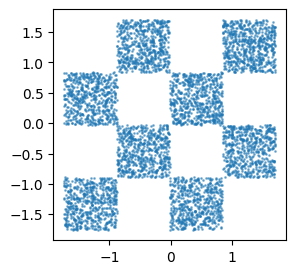

In [2]:
plt.figure(figsize=(3, 3))
plt.scatter(train_data.numpy()[:,0], train_data.numpy()[:,1], s=1.0, alpha=0.5)
plt.show()

It's also good to visualize the density as sometimes generative models overfit particular region of space. Once models are trained, when you sample from them, plot the two densities side-by-side to compare real & synthetic dataset.

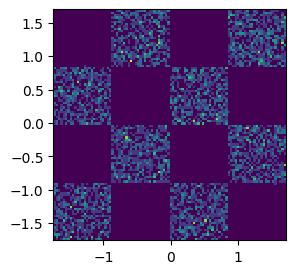

In [3]:
plt.figure(figsize=(3, 3))
plt.hist2d(train_data.numpy()[:,0], train_data.numpy()[:,1], bins=100)
plt.show()

#### Moon (use this one only if your models struggle on checkerboard)

In [ ]:
import torch
import math
from sklearn import datasets
import numpy as np

# Our dataset is mathematically defined, we can generate batches on the fly and enjoy
# an infinite-size dataset
def generate_batch(batchlen):
    """This function generates a batch of length 'batchlen' from the dataset
    """
    data = datasets.make_moons(n_samples=batchlen, noise=0.05)[0].astype(np.float32)
    return torch.from_numpy(data)

Let's plot a large batch, to see what the dataset looks like.

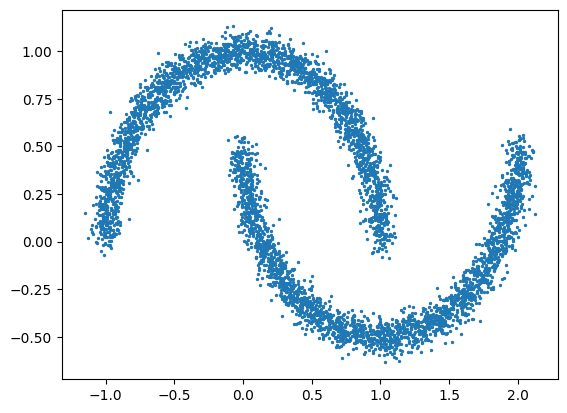

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt

batch = generate_batch(5000)

plt.scatter(batch[:,0], batch[:,1], s=2.0)
plt.show()

It's also good to visualize the density as sometimes generative models overfit particular areas. Once models are trained, when you sample from them, plot the two densities side-by-side to compare real & synthetic dataset.

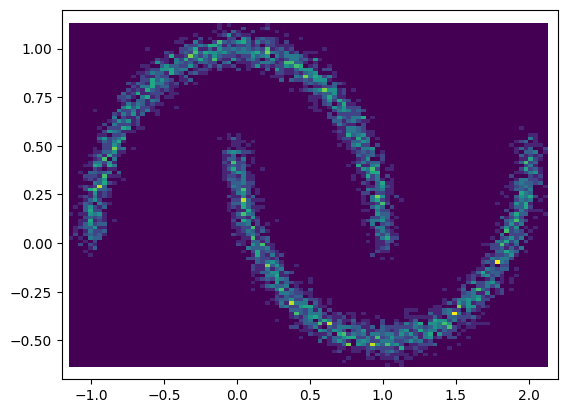

In [ ]:
plt.hist2d(batch.numpy()[:,0], batch.numpy()[:,1], bins=100)
plt.xlim([-1.2,2.2])
plt.ylim([-0.7,1.2])
plt.show()

----
### Generative Adversarial Networks

GANs structure is based on modelling the distribution $p_\theta$ as a learned deterministic function applied to a standard noise. Sampling from it is thus done as follows: first, some noise is sampled from a standard N-dimensional Gaussian distribution: $\epsilon \sim \mathcal{N}(0;I)$, and then the output is computed as a deterministic function $x = f_\theta(\epsilon)$. The function $f_\theta$ is implemented as a neural network, $\theta$ representing its learned parameters.

**Q3: What is, a priori, the impact of the choice of N, the dimension of the input noise $\epsilon$?**

> (Write your answer here)

By construction, this generator structure only allows sampling the distribution $p_\theta$, and does not allow the computation of the density $p_\theta(x)$ (at least not without strong assumptions on $f_\theta$). Such a model thus needs a comparison method based on samples to be trained.

The smart idea of GANs is to instead use another neural network to model the objective. Another neural network is introduced: a classifier (that we call the discriminator) which is trained to distinguish examples from the dataset from examples generated by $p_\theta$. The reasoning is as follows:

The discriminator $D$ is trained using a classic classifier loss between the two classes defined as the samples generated by either $p_D$ or $p_\theta$. This way $D(x)$ can be interpreted as the probability that $x$ came from the real dataset:

$$ \mathcal{L}_D = \mathbb{E}_{p_D} \left[ -\log D(x) \right] + \mathbb{E}_{p_\theta} \left[ -\log \left(1-D(x)\right) \right] $$

From that, it can be shown that for the generator fixed, the optimal discriminator is given by $D(x) = \frac{p_D(x)}{p_\theta(x) + p_D(x)}$, and when reached its loss takes a specific value:

$$ \mathcal{L}_D = 2 \left( \log 2 - JSD(p_\theta \| p_D) \right) $$
, where JSD is the JS divergence used to measure the similarity of two distributions.
$$JSD(p_\theta \| p_D) = \frac{1}{2} \mathbb{E}_{p_D} \left[ log(\frac{2p_D}{p_D+p_\theta}) \right] + \frac{1}{2} \mathbb{E}_{p_\theta} \left[ log(\frac{2p_\theta}{p_D+p_\theta}) \right]$$
So, training the generator network to *maximize* the same loss would, assuming the discriminator is always trained to optimality, minimize the Jensen-Shannon Divergence between $p_\theta$ and $p_D$, and thus bring $p_\theta$ closer to $p_D$.

**Q4: Can you anticipate a caveat of using the JSD as a training objective for the generator?**

> (Write your answer here, consider the case where the two distribution are totally different)

Having the generator trained to maximize $\mathcal{L}_D$ is equivalent to setting its training loss to $ \mathcal{L}_G = \mathbb{E}_{p_\theta} \log(1-D(x)) $.

**Q5: This loss only gives feedback to the generator on samples it generated, what problem may this cause?**

> (Write your answer here)

We will now work on implementing a GAN on a simple toy problem, to get a feeling of its behavior and test our theoretical insights. For this we will use the `pytorch` library.

While a real problem would be generating images for example (each datapoint $x$ would then be a different image), this is a kind of task that easily requires intensive CPU/GPU power, and image datasets are difficult to visualize from a geometric point of view (even small images contains hundreds of pixels, and nobody can visualize points in a 100-dimensional space). So instead we will focus on points in the plane: each datapoint $x$ will actually be a couple of numbers $(x1, x2)$, and our target dataset will be a 2D two-moons shape with some noise.

We now need to define our two neural networks, the generator and the discriminator. The generator will take as input a value $z$ sampled from a Gaussian prior, and output a value $x$ (thus a couple $(x_1,x_2)$). The discriminator takes as input a value $x$, and is a binary classifier.

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

# Choose a value for the prior dimension
PRIOR_N = 2

# Define the generator
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(PRIOR_N, 2)

    def __call__(self, z):
        return self.fc1(z)

    def generate(self, batchlen):
        z = torch.normal(torch.zeros(batchlen, PRIOR_N), 1.0)
        return self.__call__(z)


# Define the discriminator
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(2, 1)

    def __call__(self, x):
        return self.fc1(x)

With these classes in shape, now is only needed the training loop. To stick with the mathematical GAN framework, we should train the discriminator until convergence between each training step of the generator. This is not practical for two reasons: first it takes a lot of time, and second if the discriminator is too good, it will generate vanishing gradients to the generator (as seen in **Q4**).

We will thus train the discriminator a fixed number of times between each training iteration of the generator.

In [ ]:
# Number of times to train the discriminator between two generator steps
TRAIN_RATIO = 1
# Total number of training iterations for the generator
N_ITER = 20001
# Batch size to use
BATCHLEN = 128

generator = Generator()
optim_gen = torch.optim.Adam(generator.parameters(), lr=0.001, betas=(0.5,0.9))
discriminator = Discriminator()
optim_disc = torch.optim.Adam(discriminator.parameters(), lr=0.001, betas=(0.5,0.9))

for i in range(N_ITER):
    # train the discriminator
    for _ in range(TRAIN_RATIO):
        discriminator.zero_grad()
        real_batch = generate_batch(BATCHLEN)
        fake_batch = generator.generate(BATCHLEN)
        #
        # == COMPUTE THE DISCRIMINATOR LOSS HERE ==
        #
        disc_loss = 0
        disc_loss.backward()
        optim_disc.step()
    # train the generator
    generator.zero_grad()
    fake_batch = generator.generate(BATCHLEN)
    #
    # == COMPUTE THE GENERATOR LOSS HERE
    #
    gen_loss = 0
    gen_loss.backward()
    optim_gen.step()
    if i%1000 == 0:
        print('step {}: discriminator: {:.3e}, generator: {:.3e}'.format(i, float(disc_loss), float(gen_loss)))
        # plot the result
        real_batch = generate_batch(1024)
        fake_batch = generator.generate(1024).detach()
        plt.scatter(real_batch[:,0], real_batch[:,1], s=2.0, label='real data')
        plt.scatter(fake_batch[:,0], fake_batch[:,1], s=2.0, label='fake data')
        plt.legend()
        plt.show()

Complete the previous code and train your model.

Depending on your choice of parameters, the training may not go well at all, with the generator completely collapsing quickly at the beginning of the training. It has been observed by the litterature that the generator's loss $\mathcal{L}_G = \mathbb{E}_{p_\theta} \log(1-D(x))$ is often to blame.

**Q6: Why could we anticipate that this loss could cause this?**

> (Write your answer here, consider about gradient vanishing when discriminator is trained very well)

This issue is solved by replacing the generator loss by an alternative loss: $\mathcal{L}_G = \mathbb{E}_{p_\theta} [ -\log D(x) ]$ to avoid gradient vanishing.

**Q7: Inspect the impact of these different factors:**

- depth / width of the generator network
- depth / width of the discriminator network
- impact of `TRAIN_RATIO`

> (Write your answer here)

For further readings on GANs, you can see the following papers:

- Generative Adversarial Networks *(Goodfellow et al.)*: [arXiv:1406.2661](https://arxiv.org/abs/1406.2661)
- Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks *(Radford et al.)*: [arXiv:1511.06434](https://arxiv.org/abs/1511.06434)
- A Style-Based Generator Architecture for Generative Adversarial Networks *(Karras et al.)* [arxiv:1812.04948v3](https://arxiv.org/abs/1812.04948v3)

----
### Variational AutoEncoders

Another well-known approach to generative modelling is embodied by Variational AutoEncoders (VAEs). While the generative model itself and the procedure to sample it is similar to GANs, the way it is trained is not.

The main goal of VAEs is to optimize the likelihood of the real data according to the generative model. In other words, maximize $\mathbb{E}_{p_D} \left[\log p_\theta(x) \right ]$, which is equivalent to minimizing $D_{KL}(p_D \| p_\theta)$.
$$D_{KL}(p_D \| p_\theta) = \mathbb{E}_{p_D}\left[ log(\frac{p_D}{p_\theta}) \right]$$

**Q8: Prove this equivalence.**

> (Write your answer here)  

$D_{KL}(p_D \| p_\theta) = \mathbb{E}_{p_D}\left[ \log\left(\frac{p_D(x)}{p_\theta(x)}\right) \right]$
$= \int p_D(x) \log\left(\frac{p_D(x)}{p_\theta(x)}\right) dx$
$= \int p_D(x) \log(p_D(x)) dx - \int p_D(x) \log(p_\theta(x)) dx$

Then let's look into $\log(p_\theta(x))$. We now will introduce the variational distribution $q_\phi(z|x)$(the encoder in VAE that can appoximate $p_\theta(z|x)$) into the prove:

$ \log p_\theta(x)$  
$= \mathbb{E}_{q_\phi(z|x)}[\log p_\theta(x) - \log q_\phi(z|x) + \log q_\phi(z|x)] $  
$= \mathbb{E}_{q_\phi(z|x)}[\log p_\theta(x) - \log q_\phi(z|x)] + \mathbb{E}_{q_\phi(z|x)}[\log q_\phi(z|x)]$  
$= \mathbb{E}_{q_\phi(z|x)}[\log p_\theta(x|z)p_\theta(z) - \log q_\phi(z|x)] + \mathbb{E}_{q_\phi(z|x)}[\log q_\phi(z|x)] $  
$= \mathbb{E}_{q_\phi(z|x)}[\log p_\theta(x|z)] - D_{KL}(q_\phi(z|x) \parallel p_\theta(z)) + \mathbb{E}_{q_\phi(z|x)}[\log q_\phi(z|x)]$

So that we get:  
$ \log p_\theta(x) \geq \mathbb{E}_{q_\phi(z|x)}[\log p_\theta(x|z)] - D_{KL}(q_\phi(z|x) \parallel p_\theta(z))$ ==> This is the Evidence Lower Bound (ELBO).

Therefore, VAE want to maximize the ELBO by minimize $D_{KL}(p_D \parallel p_\theta)$ so that it will also maximize the $\log(p_\theta(x))$, or say minimizie $-\log(p_\theta(x))$.

However, the classes of distributions for which $\log p_\theta(x)$ can be analytically computed and optimized is very restricted, and not suitable for real world problems. The main idea of the VAE is thus to introduce a latent variable $z$ and decompose the distribution as: $p_\theta(x, z) = p_\theta(x | z) p(z)$. Here $p(z)$ is some fixed prior and $p_\theta(x | z)$ is a simple distribution whose parameters are the output of a neural network.

For example, you could have $p(z)$ be a standard $\mathcal{N}(0;1)$ and $p_\theta(x | z)$ be defined as a gaussian $\mathcal{N}(\mu_\theta(z); \sigma_\theta(z))$ where $\mu_\theta(z)$ and $\sigma_\theta(z)$ are created by the neural network you will train. In this case, the resulting distribution $p_\theta(x) = \int_z p_\theta(x|z)p(z)dz$ is an infinite mixture of Gaussians, which is a much more expressive class of distributions.

Now, this cannot stop here, as we are not able to analitically compute the density $p_\theta(x)$. The second main idea of the VAE is to introduce another, auxilliary distribution: $q_\phi(z | x)$, which will be modelled by a neural network similarly to $p_\theta(x | z)$. Introducing it allows us to create a lower bound for $\log p_\theta(x)$:

$$\log p_\theta(x) = \mathbb{E}_{z \sim q_\phi} \log p_\theta(x) = \mathbb{E}_{z \sim q_\phi} \left[ \log p_\theta(x) \frac {q_\phi(z|x)}{q_\phi(z|x)} \right]$$

Following Bayes theorem, $p_\theta(x) p_\theta(z|x) = p_\theta(x, z) = p_\theta(x|z) p(z)$, so we get:

$$\log p_\theta(x) = \mathbb{E}_{z \sim q_\phi} \left[ \log \frac{p_\theta(x|z) p(z)}{p_\theta(z|x)} \frac {q_\phi(z|x)}{q_\phi(z|x)} \right]$$

Re-organizing the terms:

$$\log p_\theta(x) = \mathbb{E}_{z \sim q_\phi} \log \frac{q_\phi(z|x)}{p_\theta(z|x)} + \mathbb{E}_{z \sim q_\phi} \log \frac{p(z)}{q_\phi(z|x)} + \mathbb{E}_{z \sim q_\phi} \log p_\theta(x | z)$$

This can be re-expressed like so:

$$\log p_\theta(x) = D_{KL}(q_\phi(z | x) \| p_\theta(z | x)) - D_{KL}(q_\phi(z | x) \| p(z)) + \mathbb{E}_{z \sim q_\phi} \log p_\theta(x|z)$$

The 3 terms of this equality can be interpreted like so:

- the first term measures how much $q_\phi(z | x)$ is similar to $p_\theta(z | x)$, or in other words is a good inverse of $p_\theta(x | z)$
- the second term measures how similar $q_\phi(z|x)$ is from the latent prior $p(z)$
- the third term is linked to how likely $p_\theta$ is to yield the given $x$ when $z$ is sampled from $q_\phi(z | x)$ rather than $p(z)$

It is interesting to note that the first term, being a KL-divergence is always positive. As such the combination of the last two terms forms a lower bound of $\log p_\theta(x)$ which *can* be computed and used as a training objective. This bound is called the *Evidence Lower-Bound (ELBO)*. Simply flipping its sign can make it into a loss that can be minimized by gradient descent:

$$ \mathcal{L}_{ELBO} = D_{KL}(q_\phi(z | x) \| p(z)) + \mathbb{E}_{z \sim q_\phi} [ - \log p_\theta(x|z) ]$$

From this formulation comes the parallel with auto-encoders that give the VAE its name: $q_\phi(z | x)$ can be seen as a *probabilistic encoder* from the data $x$ to the latent space $z$, and $p_\theta(x | z)$ can be seen as a *probabilistic decoder* from the latent space $z$ to the data $x$. In this case the second term of $\mathcal{L}_{ELBO}$ is the loss measuring the reconstruction quality of the auto-encoder, and the first term can be seens as a regularization of the latent space.

![VAE](./vae-gaussian.png)

**Q9: We can see that $p(z)$ is never sampled during the training process, how can that be a problem?**

> (Write your answer here, what will be the influence on data generation by VAE)  

The prior $p(z)$ in VAEs is chosen to be a $\mathcal{N}(0, 1)$. So if we never sample $p(z)$ during the training, we will only have limited diversity of our data due to its limited ability of only reconstructing from encoded inputs. And also, it will generalize mainly by train data so that it will performs poorly to unseen data later. Finally, the mismatch between "Prior" and "Posterior" might also be the problem since the model might only choose too simple prior or is not able to match the true distribution of data, this scenarios can lead to suboptimal representations in the latent space. So that's why we use the KL divergence term for the loss function to regularize by penalizing deviations.

A typical choice to represent $q_\phi(z | x)$ is to use a diagonal Gaussian distribution $\mathcal{N}(\mu_\phi(x); Diag(\sigma_\phi^2(x)))$, which makes the KL-divergence term of $\mathcal{L}_{ELBO}$ analytically computable.

**Q10: Assuming $p(z)$ is a $\mathcal{N}(0; Id)$ gaussian, what is the value of $D_{KL}(q_\phi(z | x) \| p(z))$?**

> (Write your answer here)  
  
As we have these 2 other expressions:
- $q_\phi(z|x)$: A diagonal Gaussian $\mathcal{N}(\mu_\phi(x), Diag(\sigma_\phi^2(x)))$  
- KL divergence of $q(z) = \mathcal{N}(\mu_q, \Sigma_q)$ and $p(z) = \mathcal{N}(\mu_p, \Sigma_p)$: $D_{KL}(q \| p) = \frac{1}{2} \left[ \mathrm{tr}(\Sigma_p^{-1} \Sigma_q) + (\mu_p - \mu_q)^\top \Sigma_p^{-1} (\mu_p - \mu_q) - k + \ln\left(\frac{|\Sigma_p|}{|\Sigma_q|}\right) \right]$  


And also as given in the question (p(z) is $\mathcal{N}(0, 1)$), we can simplfly the equation of KL divergence into: $D_{KL}(q_\phi(z|x) \| p(z)) = \frac{1}{2} \left[ \sum_i (\sigma_{\phi,i}^2 + \mu_{\phi,i}^2 - \ln(\sigma_{\phi,i}^2) - 1) \right]$  
- k: dimensionality of z
- $\mathrm{tr}$: sum of the elements on the diagonal

We will also model $p_\theta(x | z)$ as a diagonal Gaussian $\mathcal{N}(\mu_\theta(z); Diag(\sigma_\theta^2(z)))$.


**Note:** For the following, be careful about the difference between $\mu_\phi, \sigma_\phi$ which define the Gaussian distribution of the *encoder* $q_\phi$ and $\mu_\theta, \sigma_\theta$ which define the Gaussian distribution of the *decoder* $p_\theta$.

**Q11: What is the expression of $-\log p_\theta(x | z)$ for given $x$ and $z$?**

> (Write your answer here)  

Given by the Diagonal Gaussian( mean $\mu_\theta(x)$ & $Diag(\sigma_\theta^2(x))$ ) ==> $-\log p_\theta(x|z) = \frac{1}{2} \sum_i \left[ \frac{(x_i - \mu_{\theta,i}(z))^2}{\sigma_{\theta,i}^2(z)} + \log(2\pi\sigma_{\theta,i}^2(z)) \right] $

- $x_i$: i-th dimension of x
- $\mu_{\theta,i}(z)$: i-th dimension of the mean of the distribution given z
- $\sigma_{\theta,i}^2(z)$: the i-th diagonal element of the covariance matrix given z

We will build and train a VAE using the same dataset as previously, in order to compare its behavior to GANs. For numerical stability, we will interpret the output of the encoder and decoder networks as $(\mu, \log\sigma^2)$, rather than $(\mu, \sigma)$.

In [80]:
import torch.nn as nn
import torch.nn.functional as F

# Choose a value for the latent dimension
LATENT_N = 10

# Define the generator
class Encoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc_mu = nn.Linear(2, LATENT_N)
        self.fc_logvar = nn.Linear(2, LATENT_N)

    # encode a datapoint. This should return a couple of tensors (mu, logvar) representing
    # the parameters of the Gaussian q_\phi(z | x)
    def __call__(self, x):
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return (mu, logvar)


# Define the discriminator
class Decoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc_mu = nn.Linear(LATENT_N, 2)
        self.fc_logvar = nn.Linear(LATENT_N, 2)

    # decode a datapoint. This should return a couple of tensors (mu, logvar) representing
    # the parameters of the Gaussian p_\theta(z | x)
    def __call__(self, z):
        mu = self.fc_mu(z)
        logvar = self.fc_logvar(z)
        return (mu, logvar)

    def generate(self, batchlen):
        z = torch.normal(torch.zeros(batchlen, LATENT_N), 1.0)
        (mu, logvar) = self.__call__(z)
        return torch.normal(mu, torch.exp(0.5*logvar))

From this, the parameters of both networks are trained conjointly using the same loss $\mathcal{L}_{ELBO}$.

step 0: KL: 6.306e+02, rec: 1.166e+03


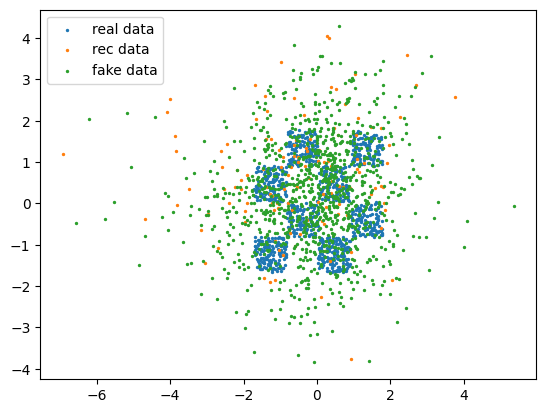

step 1000: KL: 2.378e+01, rec: 7.830e+02


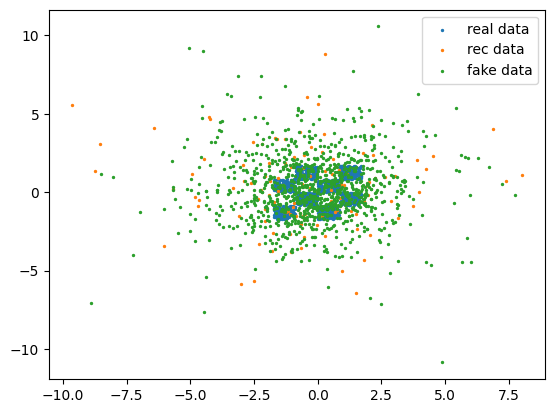

step 2000: KL: 3.186e+00, rec: 8.590e+02


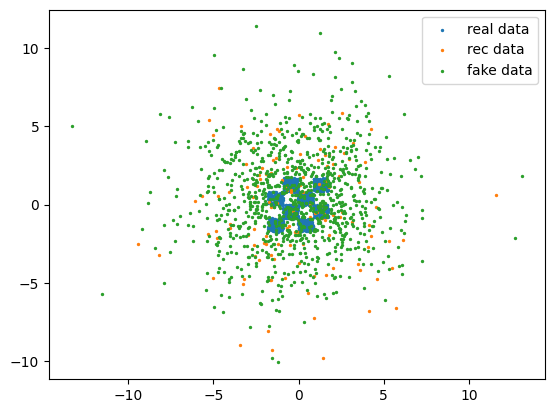

step 3000: KL: 1.750e-01, rec: 9.657e+02


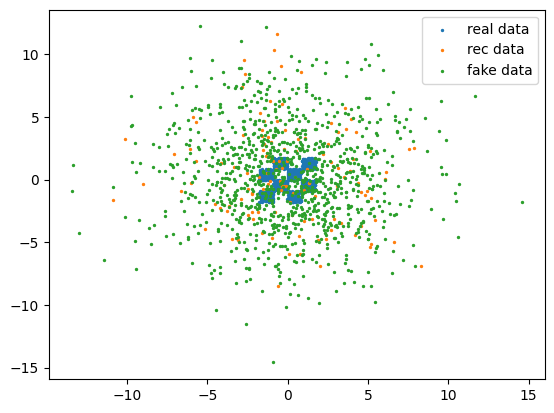

step 4000: KL: 4.466e-02, rec: 1.072e+03


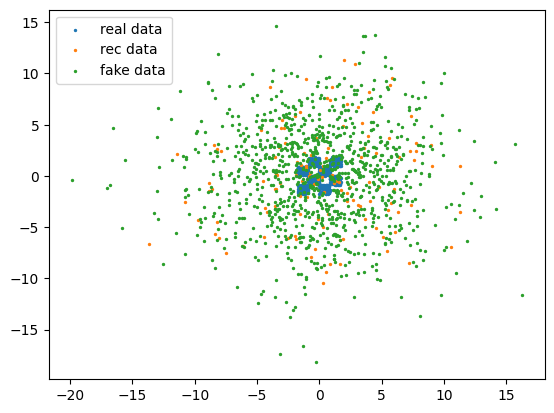

step 5000: KL: 3.376e-02, rec: 1.149e+03


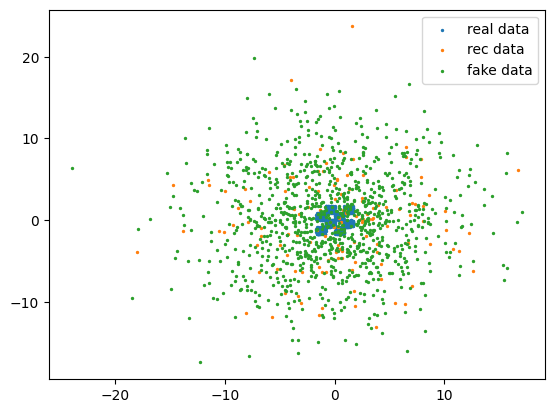

step 6000: KL: 1.749e-02, rec: 1.209e+03


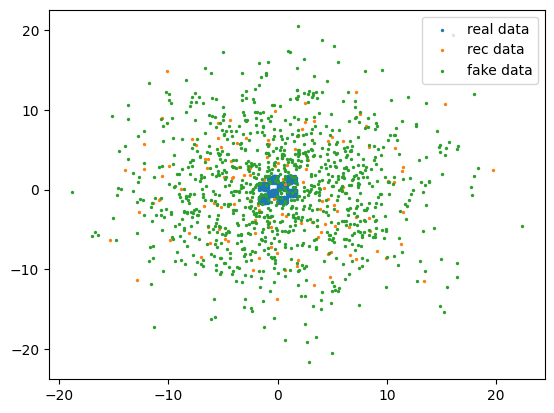

step 7000: KL: 1.880e-02, rec: 1.275e+03


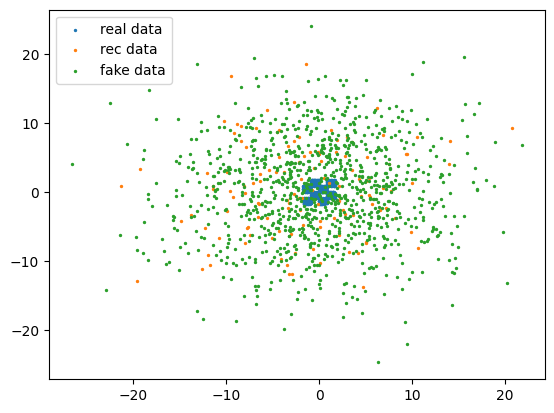

step 8000: KL: 9.044e-03, rec: 1.293e+03


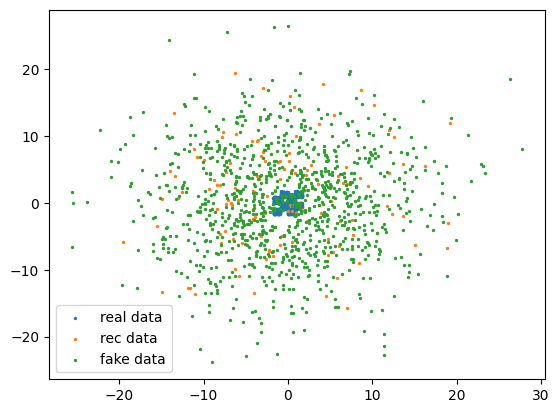

step 9000: KL: 6.213e-03, rec: 1.296e+03


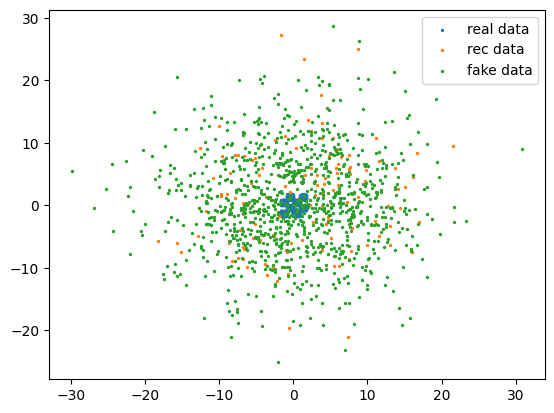

step 10000: KL: 9.444e-03, rec: 1.353e+03


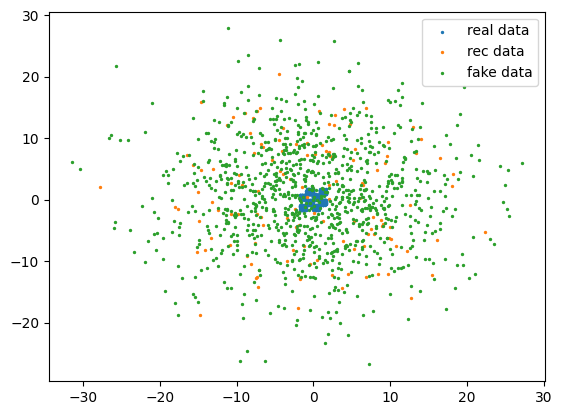

step 11000: KL: 2.073e-02, rec: 1.436e+03


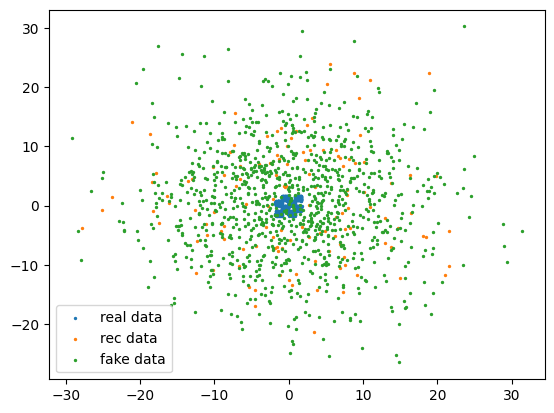

step 12000: KL: 1.652e-02, rec: 1.432e+03


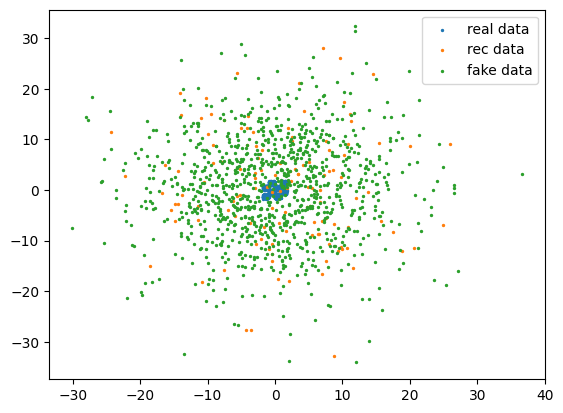

step 13000: KL: 5.579e-03, rec: 1.455e+03


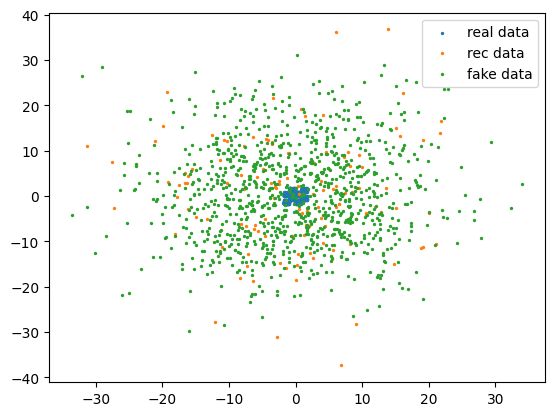

step 14000: KL: 4.028e-03, rec: 1.501e+03


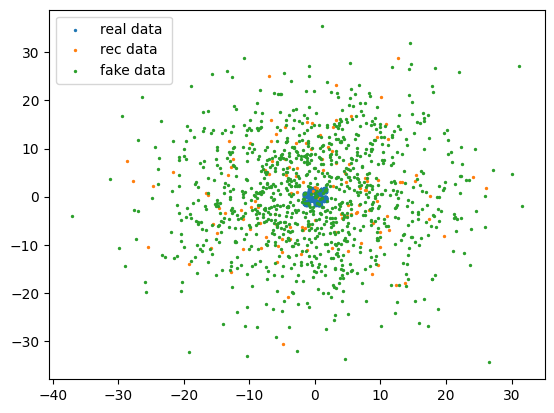

step 15000: KL: 7.269e-03, rec: 1.510e+03


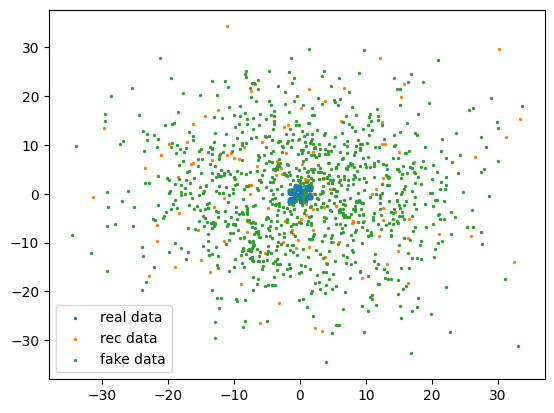

step 16000: KL: 6.724e-03, rec: 1.537e+03


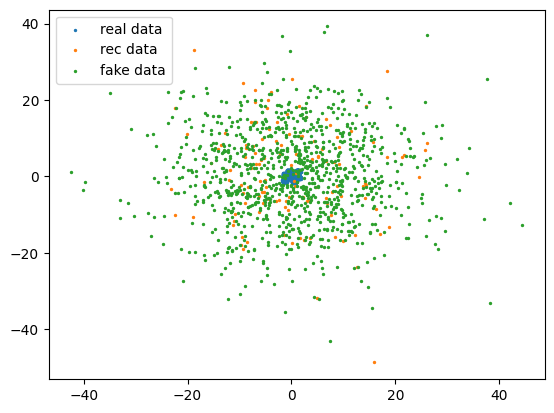

step 17000: KL: 1.344e-02, rec: 1.569e+03


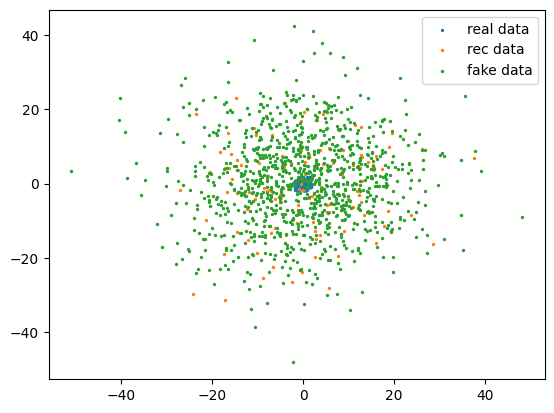

step 18000: KL: 1.230e-02, rec: 1.497e+03


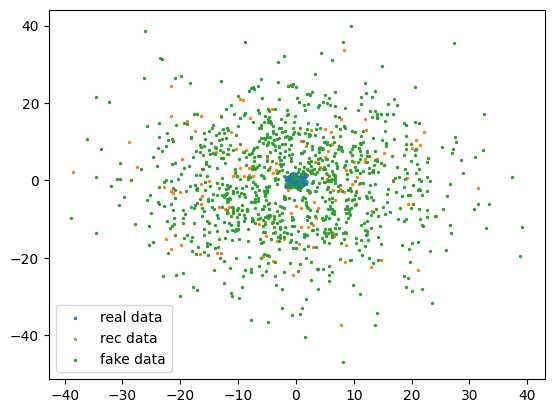

step 19000: KL: 1.971e-02, rec: 1.541e+03


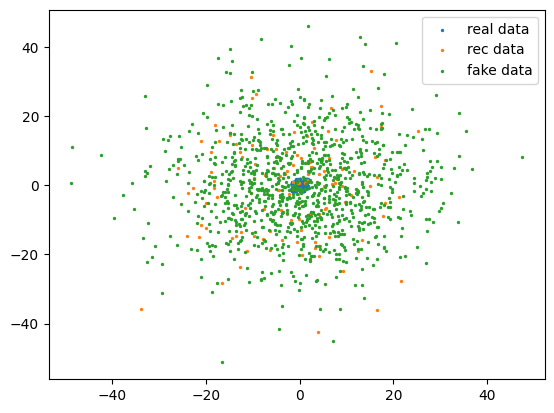

step 20000: KL: 2.297e-02, rec: 1.601e+03


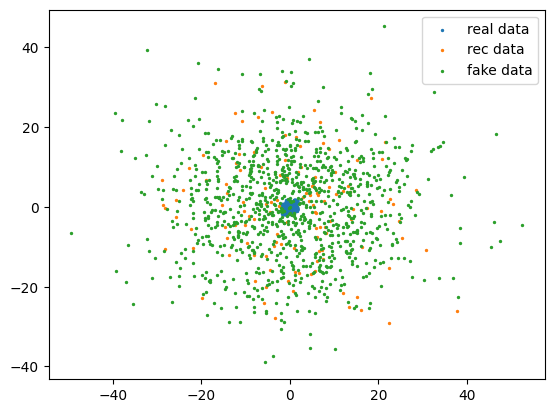

step 21000: KL: 1.974e-02, rec: 1.608e+03


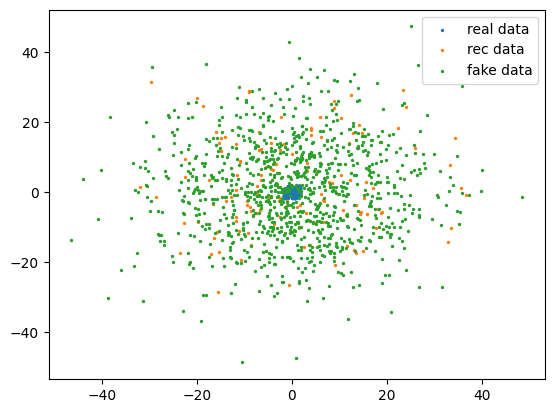

step 22000: KL: 7.074e-03, rec: 1.597e+03


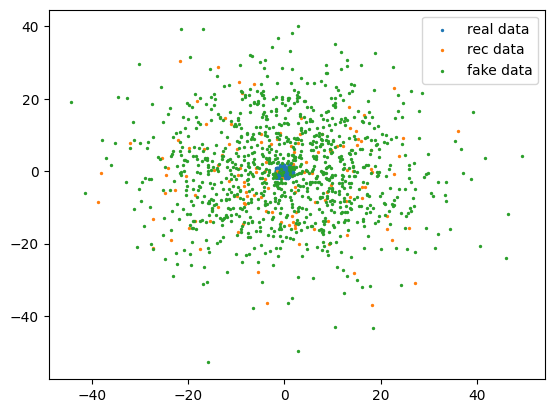

step 23000: KL: 8.751e-03, rec: 1.619e+03


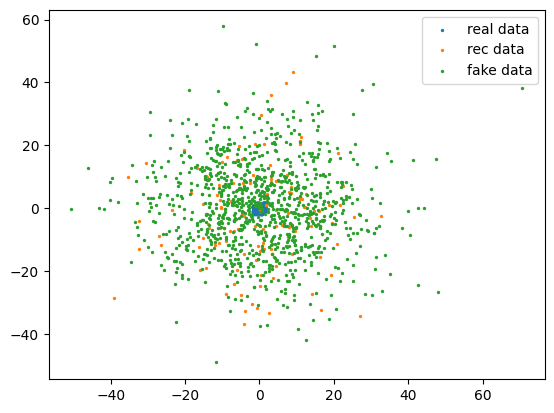

step 24000: KL: 1.951e-02, rec: 1.638e+03


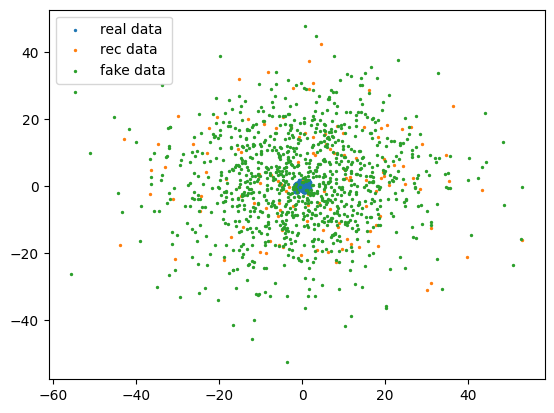

step 25000: KL: 1.574e-02, rec: 1.604e+03


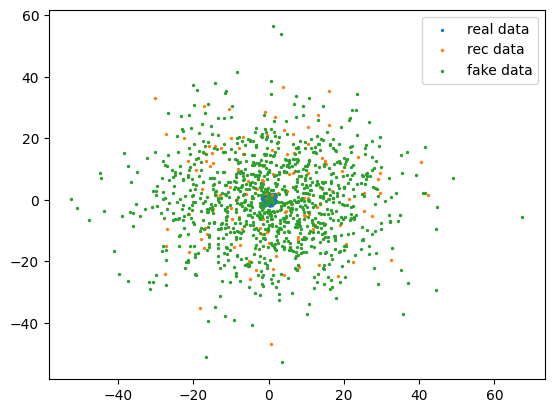

step 26000: KL: 2.613e-02, rec: 1.626e+03


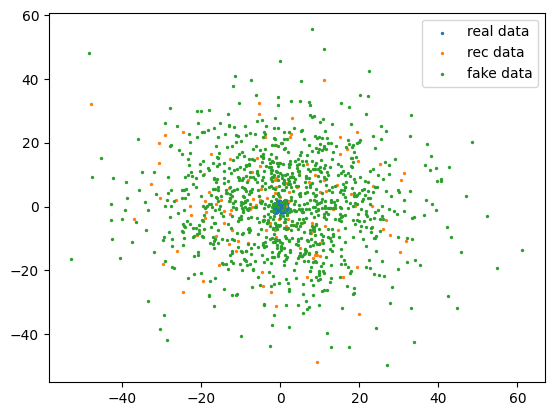

step 27000: KL: 2.037e-02, rec: 1.650e+03


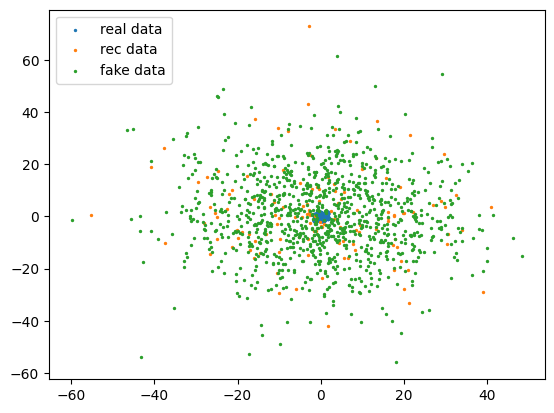

step 28000: KL: 2.161e-02, rec: 1.679e+03


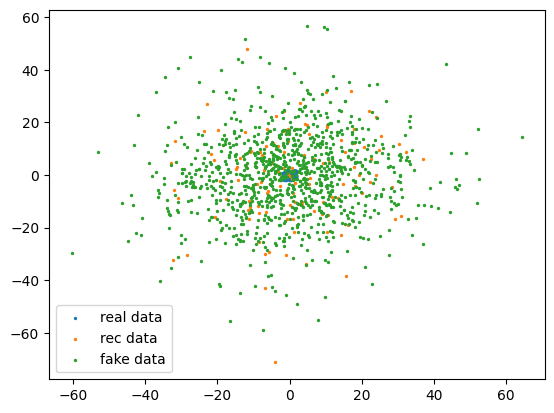

step 29000: KL: 1.521e-02, rec: 1.648e+03


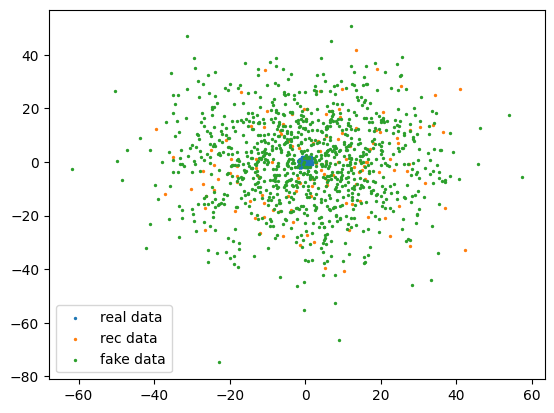

step 30000: KL: 2.272e-02, rec: 1.708e+03


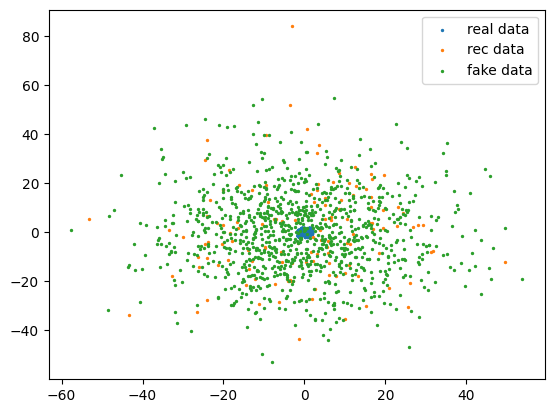

step 31000: KL: 4.906e-02, rec: 1.696e+03


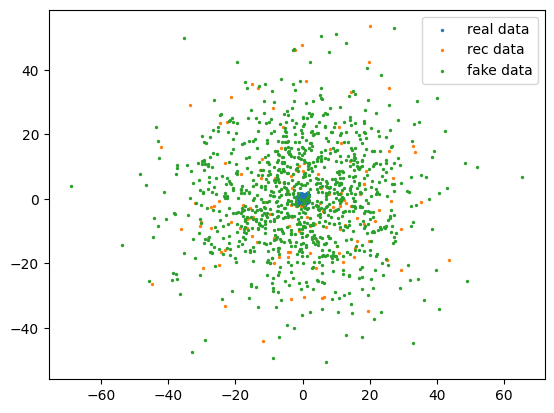

step 32000: KL: 1.839e-02, rec: 1.694e+03


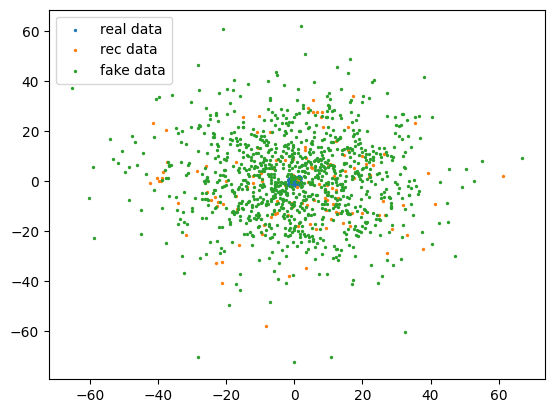

step 33000: KL: 1.330e-02, rec: 1.708e+03


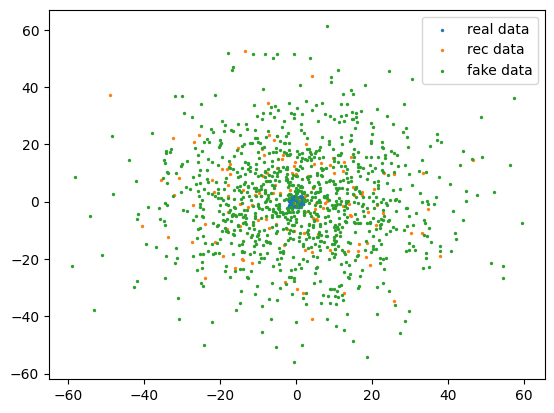

step 34000: KL: 3.521e-02, rec: 1.750e+03


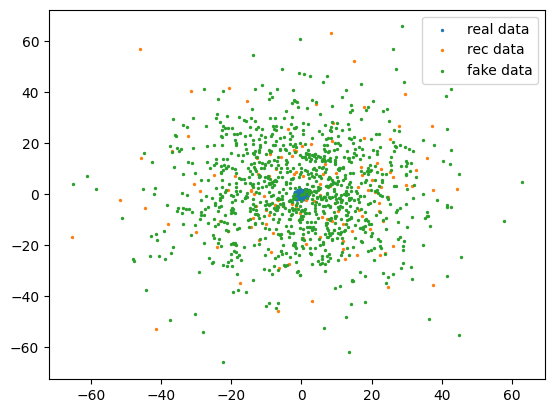

step 35000: KL: 1.651e-02, rec: 1.727e+03


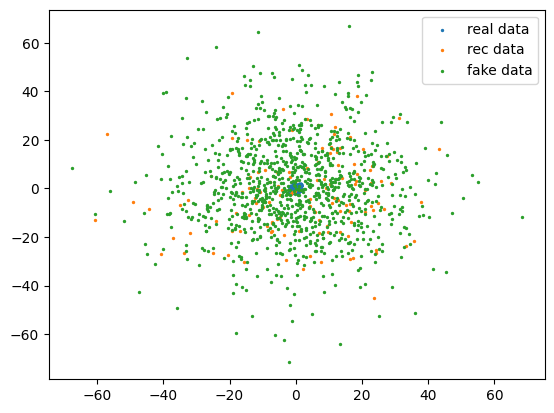

step 36000: KL: 2.755e-02, rec: 1.736e+03


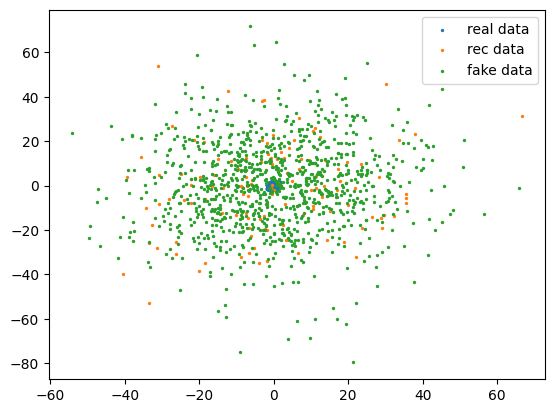

step 37000: KL: 1.609e-02, rec: 1.737e+03


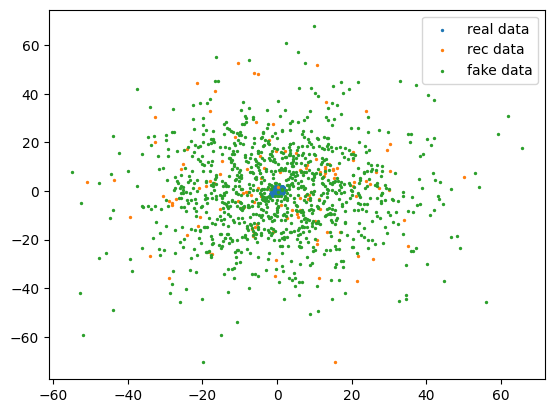

step 38000: KL: 2.919e-02, rec: 1.755e+03


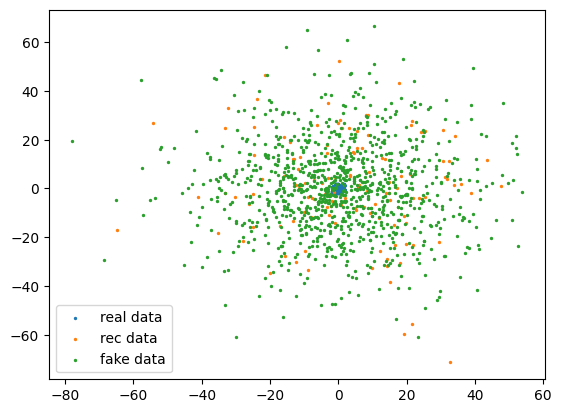

step 39000: KL: 1.995e-02, rec: 1.717e+03


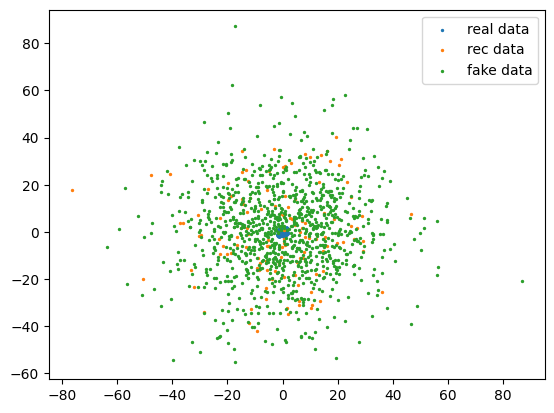

step 40000: KL: 2.096e-02, rec: 1.734e+03


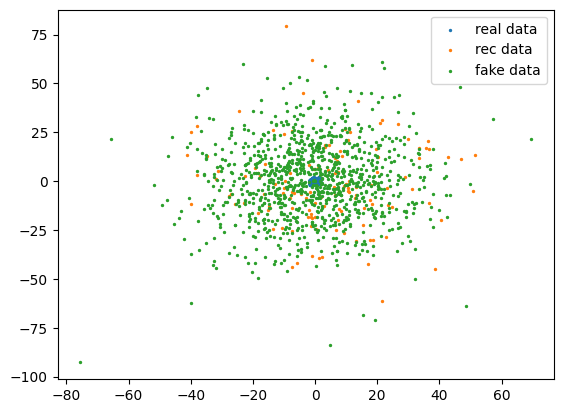

In [81]:
# Total number of training iterations for the VAE
N_ITER = 40001
# Batch size to use
BATCHLEN = 128

encoder = Encoder()
optim_enc = torch.optim.Adam(encoder.parameters(), lr=0.001, betas=(0.5,0.9))
decoder = Decoder()
optim_dec = torch.optim.Adam(decoder.parameters(), lr=0.001, betas=(0.5,0.9))

for i in range(N_ITER):
    encoder.zero_grad()
    decoder.zero_grad()

    x = generate_batch(BATCHLEN)

    enc_mu, enc_logvar = encoder(x)
    #
    # COMPUTE THE KL PART OF THE LOSS HERE
    #
    loss_kl = -0.5 * torch.sum(1 + enc_logvar - enc_mu.pow(2) - enc_logvar.exp())
    #
    # SAMPLE z FROM q(z|x) HERE
    #
    epsilon = torch.randn_like(enc_logvar)
    z = enc_mu + epsilon * torch.exp(0.5 * enc_logvar)

    dec_mu, dec_logvar = decoder(z)
    #
    # COMPUTE THE RECONSTRUCTION PART OF THE LOSS HERE
    #
    x_pred = torch.normal(dec_mu, torch.exp(0.5 * dec_logvar))
    loss_rec = torch.sum((x - x_pred).pow(2) / torch.exp(dec_logvar) + dec_logvar)

    (loss_kl + loss_rec).backward()
    optim_enc.step()
    optim_dec.step()
    if i%1000 == 0:
        print('step {}: KL: {:.3e}, rec: {:.3e}'.format(i, float(loss_kl), float(loss_rec)))
        # plot the result
        real_batch = generate_batch(1024)
        rec_batch = torch.normal(dec_mu, torch.exp(0.5*dec_logvar)).detach()
        fake_batch = decoder.generate(1024).detach()
        plt.scatter(real_batch[:,0], real_batch[:,1], s=2.0, label='real data')
        plt.scatter(rec_batch[:,0], rec_batch[:,1], s=2.0, label='rec data')
        plt.scatter(fake_batch[:,0], fake_batch[:,1], s=2.0, label='fake data')
        plt.legend()
        plt.show()

**Q12: Try hardcoding $\sigma_\theta(z)$ to some small value (like 1E-4) rather than allowing the decoder to learn it. What does it change?**

> (Write your answer here, observe the plots)

In [82]:
# Change Decoder
# Hardcoded log variance to some small value (like 1E-4)
class Decoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc_mu = nn.Linear(LATENT_N, 2)
        # self.fc_logvar removed because we're hardcoding it

    def __call__(self, z):
        mu = self.fc_mu(z)
        logvar = torch.full_like(mu, math.log(1e-4))
        return (mu, logvar)

    def generate(self, batchlen):
        z = torch.normal(torch.zeros(batchlen, LATENT_N), 1.0)
        (mu, logvar) = self.__call__(z)
        return torch.normal(mu, torch.exp(0.5*logvar))

step 0: KL: 4.046e+02, rec: 2.674e+06


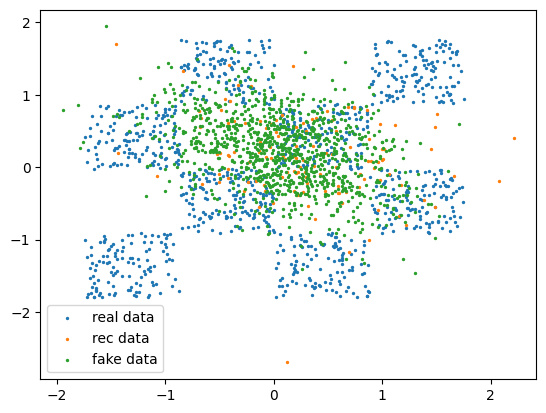

step 1000: KL: 8.753e-05, rec: 3.327e+06


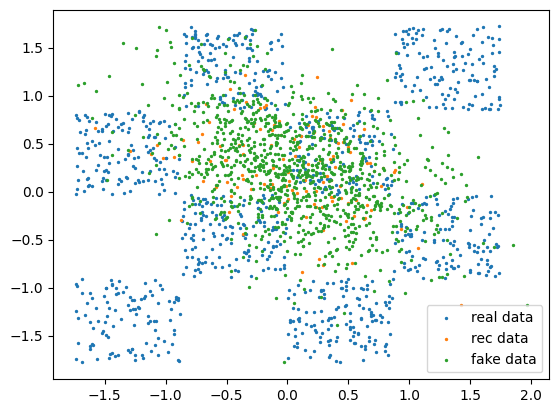

step 2000: KL: 9.325e-05, rec: 3.359e+06


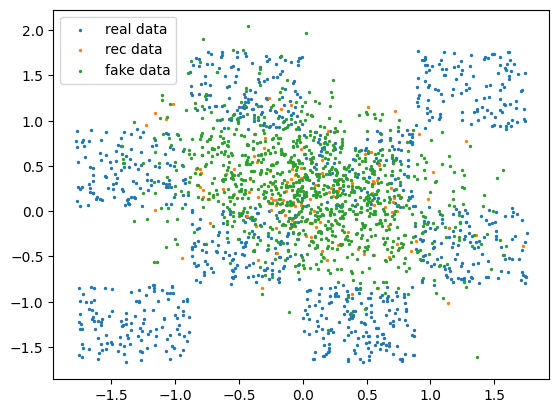

step 3000: KL: 6.589e-05, rec: 3.374e+06


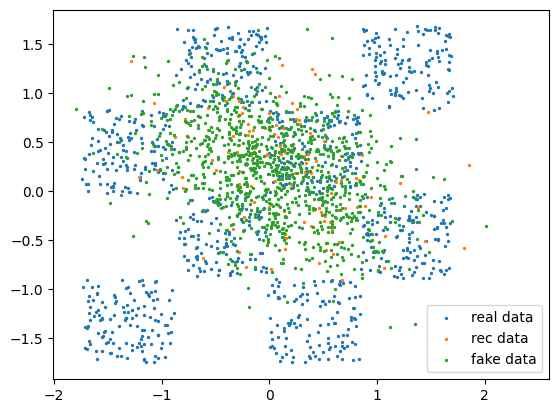

step 4000: KL: 6.032e-05, rec: 3.167e+06


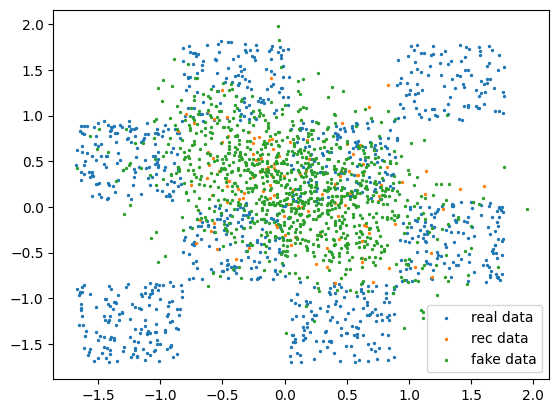

step 5000: KL: 1.154e-04, rec: 3.400e+06


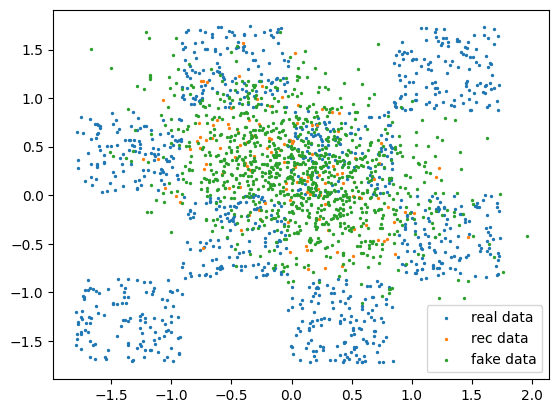

step 6000: KL: 7.671e-05, rec: 3.134e+06


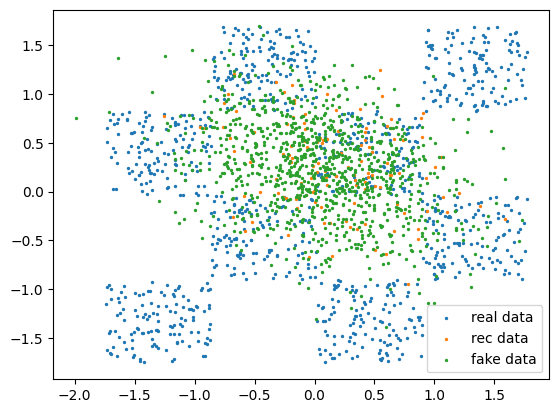

step 7000: KL: 6.950e-05, rec: 3.508e+06


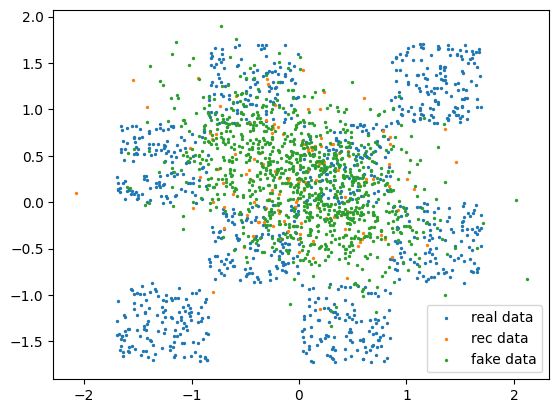

step 8000: KL: 1.713e-04, rec: 3.371e+06


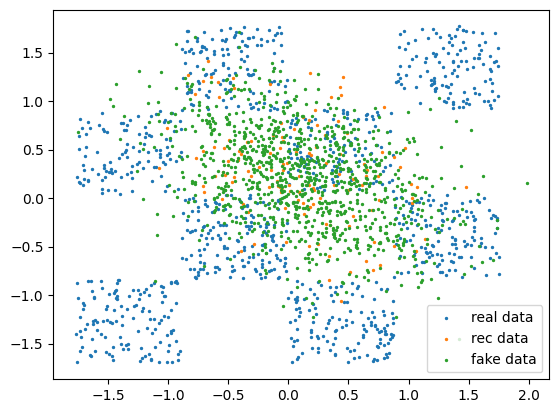

step 9000: KL: 1.979e-04, rec: 3.292e+06


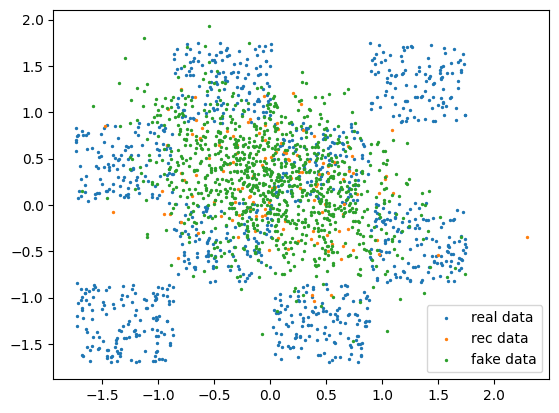

step 10000: KL: 1.404e-04, rec: 3.252e+06


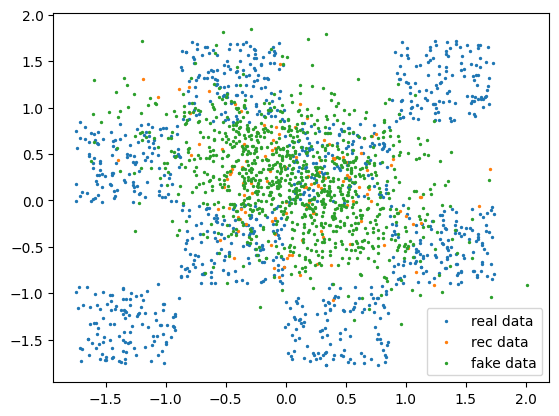

step 11000: KL: 1.632e-04, rec: 3.486e+06


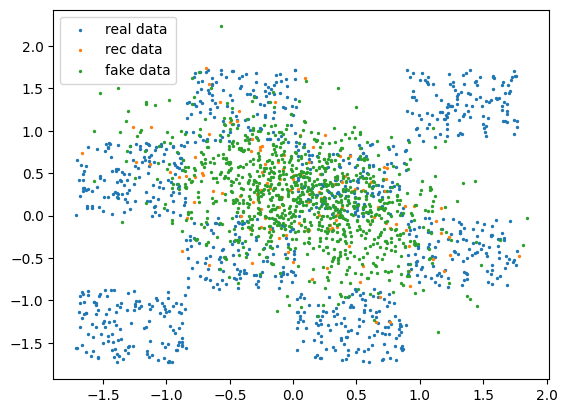

step 12000: KL: 1.632e-04, rec: 3.548e+06


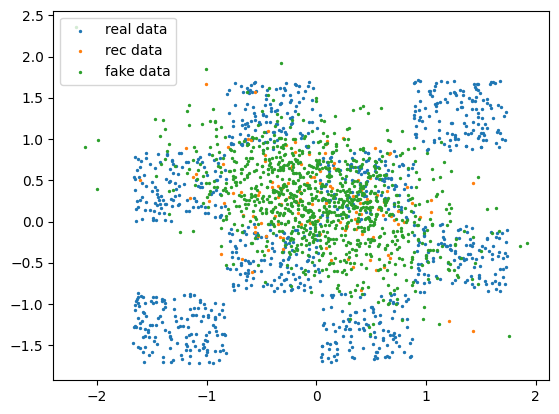

step 13000: KL: 7.674e-05, rec: 3.385e+06


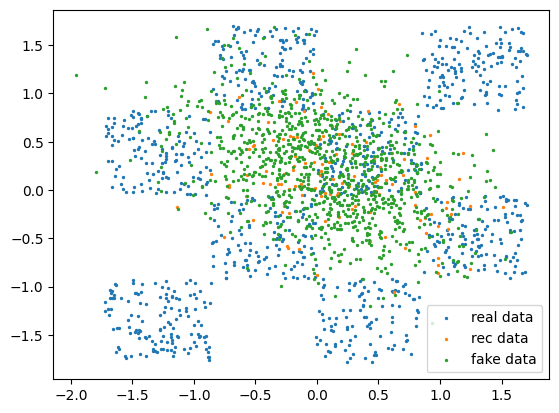

step 14000: KL: 3.606e-05, rec: 3.695e+06


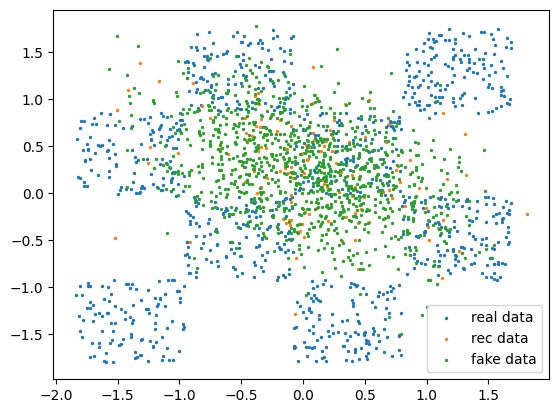

step 15000: KL: 6.714e-05, rec: 3.481e+06


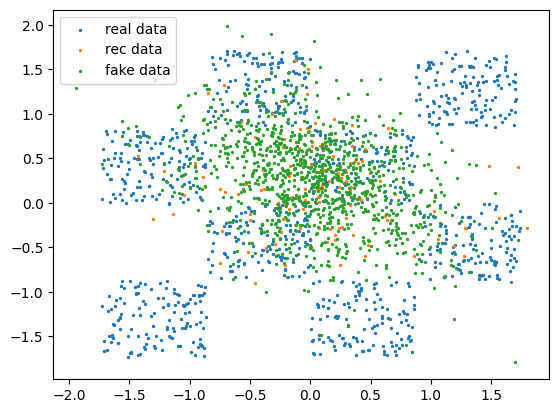

step 16000: KL: 4.303e-05, rec: 3.241e+06


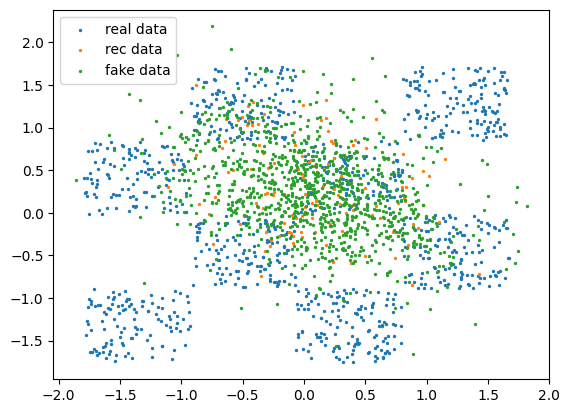

step 17000: KL: 8.646e-05, rec: 3.567e+06


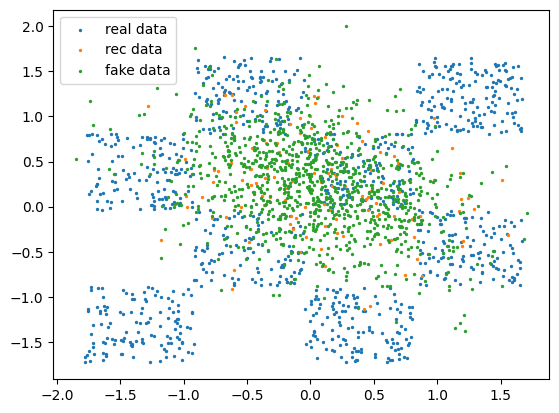

step 18000: KL: 9.468e-05, rec: 3.511e+06


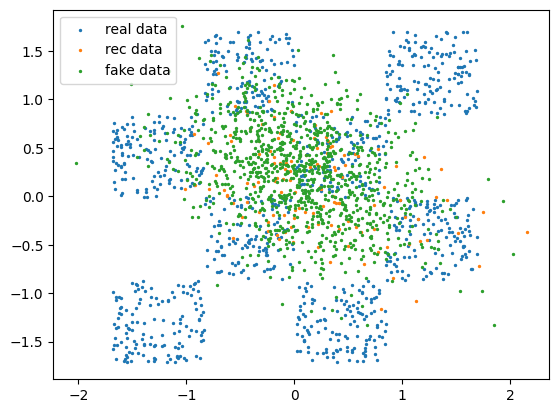

step 19000: KL: 6.619e-05, rec: 3.600e+06


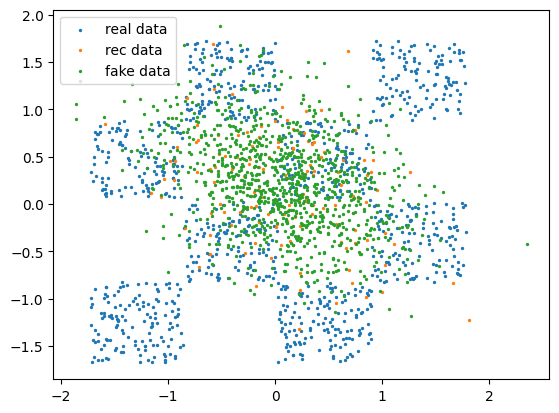

step 20000: KL: 1.024e-04, rec: 3.110e+06


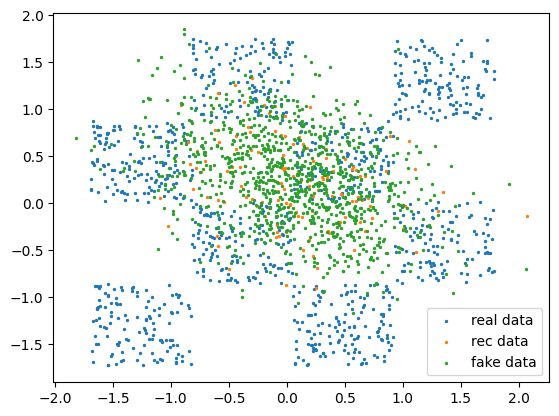

step 21000: KL: 9.826e-05, rec: 3.396e+06


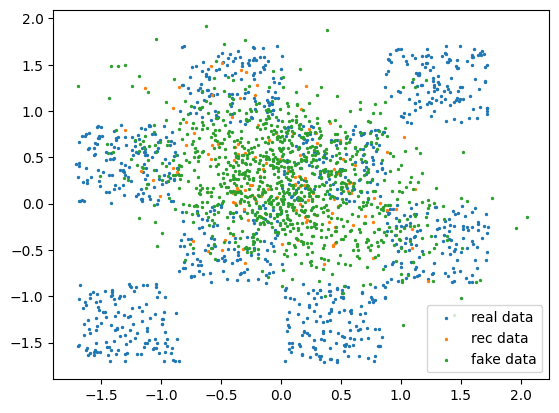

step 22000: KL: 7.012e-05, rec: 3.168e+06


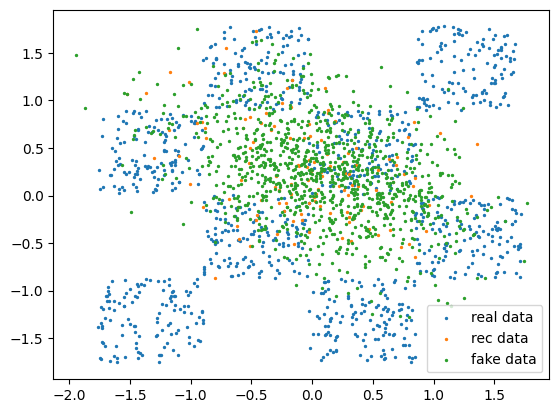

step 23000: KL: 8.756e-05, rec: 3.085e+06


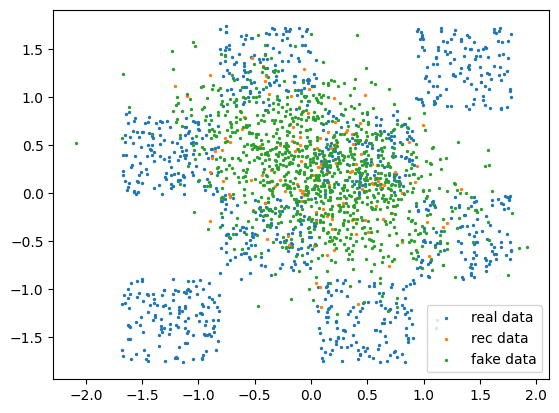

step 24000: KL: 4.613e-05, rec: 3.129e+06


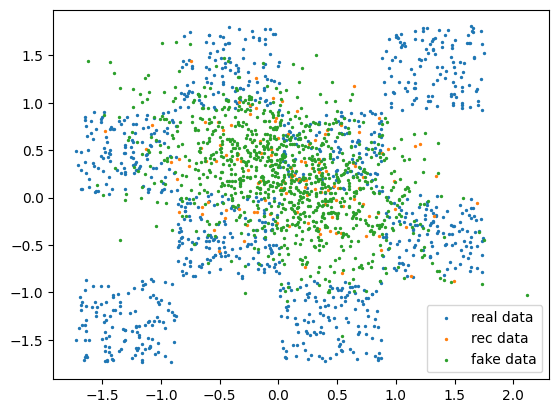

step 25000: KL: 1.140e-04, rec: 3.222e+06


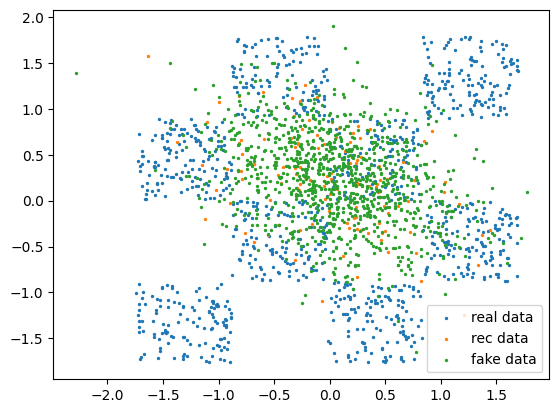

step 26000: KL: 1.233e-04, rec: 3.682e+06


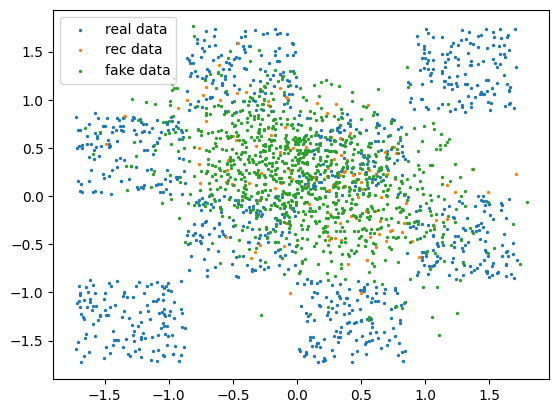

step 27000: KL: 7.319e-05, rec: 3.230e+06


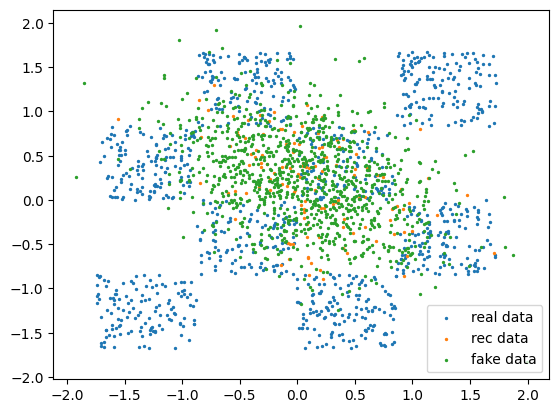

step 28000: KL: 1.642e-04, rec: 3.346e+06


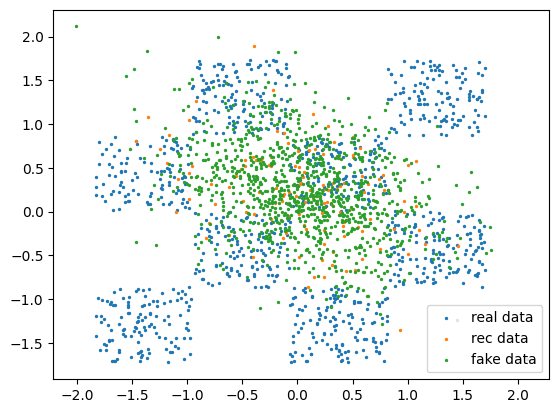

step 29000: KL: 2.129e-04, rec: 3.358e+06


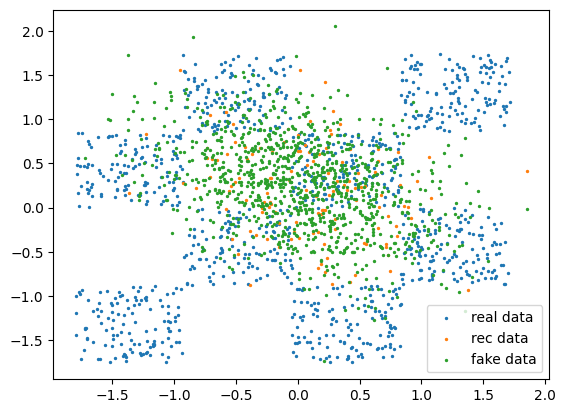

step 30000: KL: 5.350e-05, rec: 3.654e+06


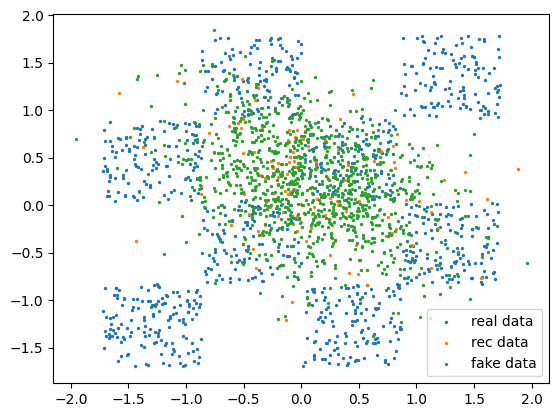

step 31000: KL: 3.070e-05, rec: 3.566e+06


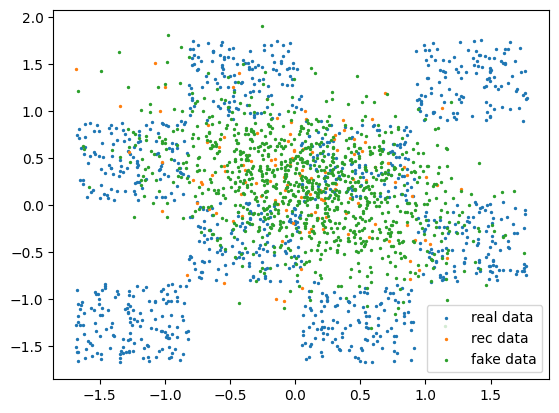

step 32000: KL: 1.253e-04, rec: 3.333e+06


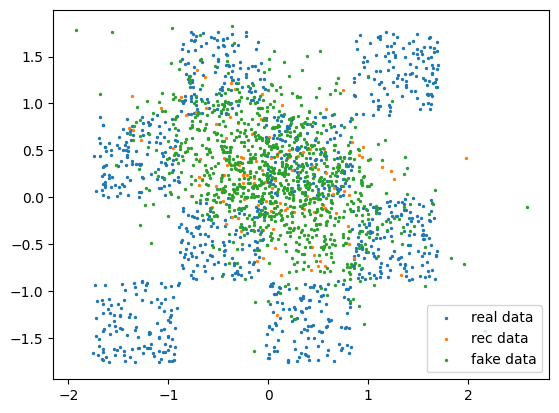

step 33000: KL: 1.180e-04, rec: 3.285e+06


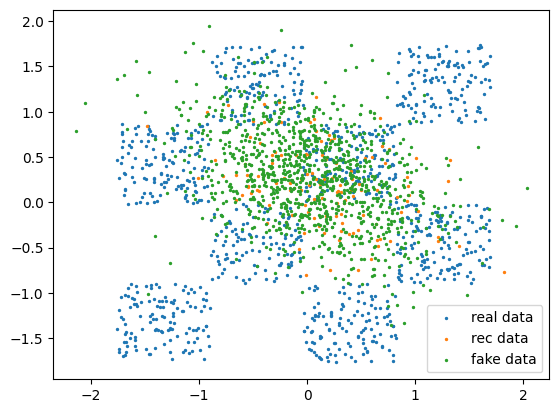

step 34000: KL: 7.552e-05, rec: 3.142e+06


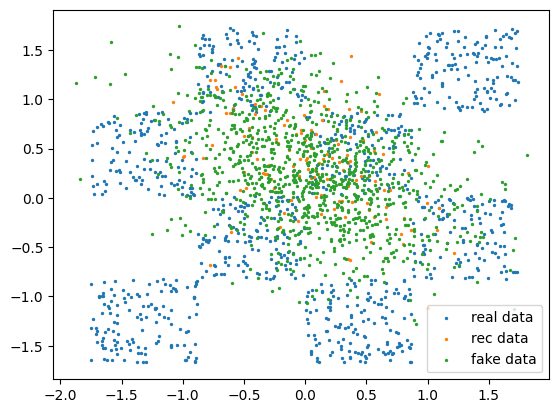

step 35000: KL: 9.757e-05, rec: 3.689e+06


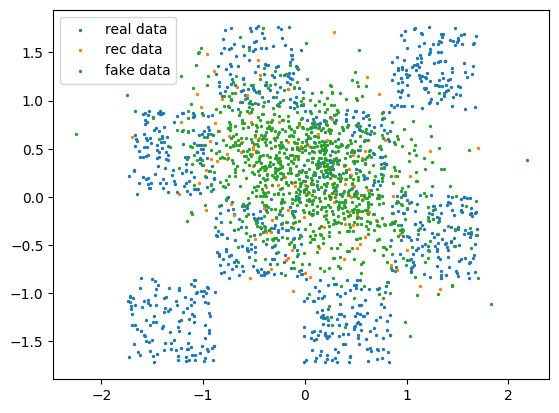

step 36000: KL: 7.805e-05, rec: 3.283e+06


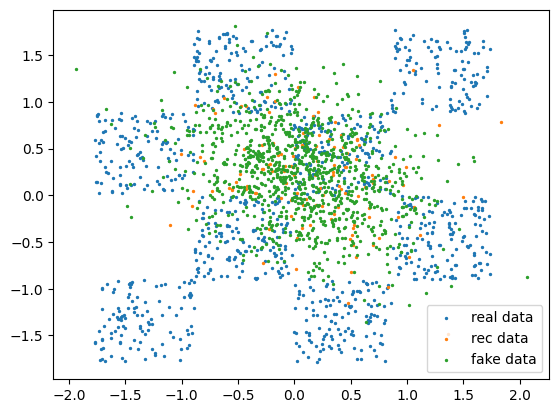

step 37000: KL: 5.856e-05, rec: 3.400e+06


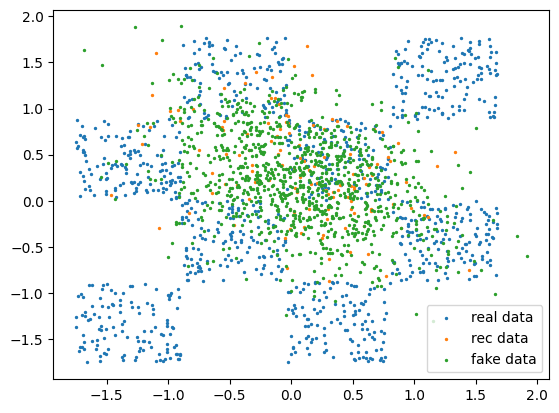

step 38000: KL: 6.455e-05, rec: 3.512e+06


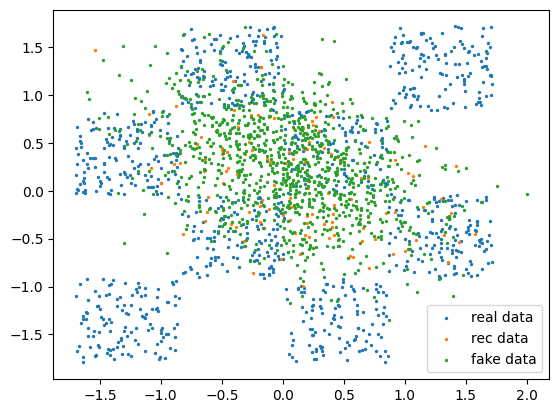

step 39000: KL: 2.173e-04, rec: 3.283e+06


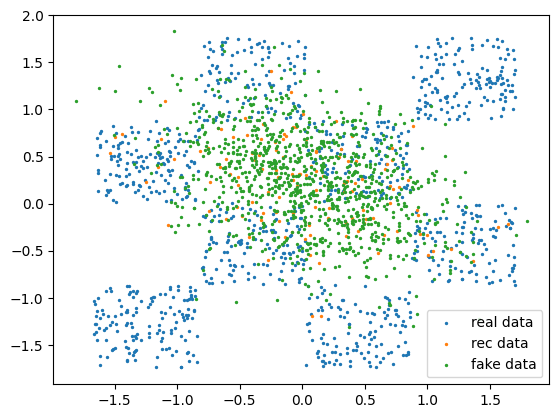

step 40000: KL: 2.779e-04, rec: 3.653e+06


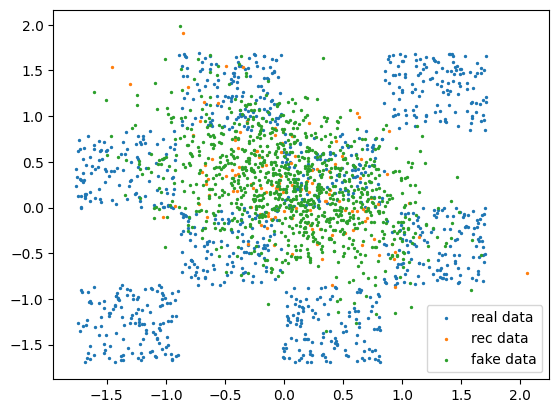

In [83]:
# Total number of training iterations for the VAE
N_ITER = 40001
# Batch size to use
BATCHLEN = 128

encoder = Encoder()
optim_enc = torch.optim.Adam(encoder.parameters(), lr=0.001, betas=(0.5,0.9))
decoder = Decoder()
optim_dec = torch.optim.Adam(decoder.parameters(), lr=0.001, betas=(0.5,0.9))

for i in range(N_ITER):
    encoder.zero_grad()
    decoder.zero_grad()

    x = generate_batch(BATCHLEN)

    enc_mu, enc_logvar = encoder(x)
    #
    # COMPUTE THE KL PART OF THE LOSS HERE
    #
    loss_kl = -0.5 * torch.sum(1 + enc_logvar - enc_mu.pow(2) - enc_logvar.exp())
    #
    # SAMPLE z FROM q(z|x) HERE
    #
    epsilon = torch.randn_like(enc_logvar)
    z = enc_mu + epsilon * torch.exp(0.5 * enc_logvar)

    dec_mu, dec_logvar = decoder(z)
    #
    # COMPUTE THE RECONSTRUCTION PART OF THE LOSS HERE
    #
    x_pred = torch.normal(dec_mu, torch.exp(0.5 * dec_logvar))
    loss_rec = torch.sum((x - x_pred).pow(2) / torch.exp(dec_logvar) + dec_logvar)

    (loss_kl + loss_rec).backward()
    optim_enc.step()
    optim_dec.step()
    if i%1000 == 0:
        print('step {}: KL: {:.3e}, rec: {:.3e}'.format(i, float(loss_kl), float(loss_rec)))
        # plot the result
        real_batch = generate_batch(1024)
        rec_batch = torch.normal(dec_mu, torch.exp(0.5*dec_logvar)).detach()
        fake_batch = decoder.generate(1024).detach()
        plt.scatter(real_batch[:,0], real_batch[:,1], s=2.0, label='real data')
        plt.scatter(rec_batch[:,0], rec_batch[:,1], s=2.0, label='rec data')
        plt.scatter(fake_batch[:,0], fake_batch[:,1], s=2.0, label='fake data')
        plt.legend()
        plt.show()

> (Write your answer here, observe the plots)  

Small $\sigma_\theta(z)$ will change VAE's behavior because it tells the model that the distribution output for any point in the space is very narrow. And due to this situation, it will cause following results. First, the reconstruction loss becomes the dominating term in the loss function so that it leads to high loss and destabilization in the training process. And then, the model's ability to generalize might significantly reduced because it only focuses on minimizing reconstruction error with an unrealistic expectation of the output variance. Furthermore, there will be overfitting issue to the noise since it tries to reconstruct the inputs but overemphasizes precision too much without considering the inherent noise. So that's why in the plot, we can observe that "rec data" points doesn't cover the same spread as "real data" points and "fake data" doesn't capture the variability from "real data". So it turns ouy clustering only tightly around the mean of the learned distribution.

**Q13: How do the power of encoder and decoder affect the overall training of the VAE?**

> (Write your answer here)  

**Encoder Power**: If we have a powerful encoder, then we will be able to learn complex distributions to accurately approximate the true posterior distribution p(z|x). However, it might dominate the learning process if the encoder becomes too powerful. It will strongly affect the effective learning ability of the decoder and provide less informative latent space.

**Decoder Power**: If we have a powerful decoder, then we will be able to accurately reconstruct data from the latent space and thus to generate good data that closely resembles the original dataset. However, it might collapse if the decoder becomes too powerful. It will ignore the latent variables because it can reconstruct the data too easily and thus lose the meaningful latent representation.

So that's why we need to find the good balance of the power of encoder and decoder.> (Write your answer here)

---
### Normalizing flows

Another approach to generative modelling is given by Normalizing flows. The idea is to learn a mapping $f$ from the data distribution $p_D$ (defined over a space $\mathcal{X}$) to a known distribution (typically, a normal distribution) from which we know how to sample. Two key points are to be noted:
1. The mapping needs to be bijective (i.e., the network needs to be invertible).
2. The exact likelihood of a data point should be easily computable.

To tackle point 2, let us introduce some notations.
Let us denote by $p_\mathcal{N} = \mathcal{N}(0,1)$ the normal distribution from which we sample $z$. We obtain points $x$ by computing $x = f^{-1}(z)$, and we hope that the distribution of points obtained this way will match more or less the dataset distribution $p_D$ of real examples.
We denote by $p_G$ this obtained distribution, that is, the image of $p_\mathcal{N}$ through $f^{-1}$: $p_G$ is a probability distribution defined on $\mathcal{X}$, and our goal will be to optimize the mapping $f$ so that $p_G$ is close to $p_D$. If you are not familiar with images of distributions, the definition is here: https://en.wikipedia.org/wiki/Pushforward_measure ; it can be defined as the measure that satisfies this change of variables: $\int_{z\sim p_\mathcal{N}} g(f^{-1}(z)) dz = \int_{x\sim p_{G}} g(x) dx$ for all functions $g$. Another notation for this is $\int_{z} g(f^{-1}(z)) \;dp_\mathcal{N}(z) = \int_{x} g(x) \;dp_{G}(x)$.
We will build on the following identity:
$$
\log(p_X(x))=\log(p_Z(z))+\log \det J_f
$$
where $J_f = \frac{df(x)}{dx}$ is the Jacobian matrix of the function $f$.

**Q14: Justify the above equality**

> (Write your answer here)

Let us consider, as an optimization criterion, the Kullback-Leibler divergence $KL(p_D||p_G)$.

**Q15: Express this loss as a (very simple) function of the quantity above.**

> (Write your answer here)

A challenging task is then to find a network, such that f is:
* invertible
* $\det J_f$ is tractable
* $f$ is general enough

A common architecture is the so called real-valued non-volume preserving (real-NVP), which is made of coupling layers.

The idea of coupling layers is to cut the input $x$ in two (let say keeping only the $d < D$ first dimensions on one hand and the $D-d$ other dimensions on the other hand, with $D$ the dimension of the input space $\mathcal{X}$). This gives inputs $x_{1:d}$ and $x_{d+1:D}$. Then the forward pass is defined as:
* $y_{1:d}=x_{1:d}$
* $y_{d+1:D}=x_{d+1:D}\odot \exp(s(x_{1:d})) + t(x_{1:d})$

where $s,t:\mathbb{R}^d\to\mathbb{R}^{D-d}$ and $\odot$ is the coefficient-wise multiplication of two vectors of the same size.

Those equations can be resumed in the following diagram:
![real NVP diagram](./realNVPforward.png)

**Q16: Show that the defined mapping is indeed invertible**

> (Write your answer here)

**Q17: Show that the determinant of the Jacobian of such a mapping is $\exp(\sum_j s(x_{1:d})_j)$**

> (Write your answer here)

**Q18: Fill the Coupling layer structure below by defining suitable functions sfun and tfun (using a final tanh in sfun is highly recommended) and the inverse pass**

In [ ]:
import torch
from torch import nn
from torch.nn import functional as F


class CouplingLayer(nn.Module):
    def __init__(self, input_size, output_size, hidden_size, mask):
        super().__init__()
        ### define here variables to use in f and s ###

        ###
        self.mask = mask #we use the mask variable to make the cut in input

    def sfun(self, x_m):
        return x_m

    def tfun(self, x_m):
        return x_m

    def forward(self, x):
        x_m = x * self.mask
        s_out = self.sfun(x_m) # multiplicative block
        t_out = self.tfun(x_m) # additive block
        y = x_m + (1-self.mask)*(x*torch.exp(s_out)+t_out)
        log_det_jacobian = s_out.sum(dim=1)  # CRITICAL
        return y, log_det_jacobian

    def inverse(self, y):
        return y

In [ ]:
class RealNVP(nn.Module):
    def __init__(self, input_size, output_size, hidden_size, mask, n_layers=6):
        super().__init__()
        assert n_layers >= 2, "num of coupling layers should be greater or equal to 2"

        self.modules = []
        self.modules.append(CouplingLayer(input_size, output_size, hidden_size, mask))
        for _ in range(n_layers-2):
            mask = 1 - mask
            self.modules.append(CouplingLayer(input_size, output_size, hidden_size, mask))
        self.modules.append(CouplingLayer(input_size, output_size, hidden_size, 1 - mask))
        self.module_list = nn.ModuleList(self.modules)

    def forward(self, x):
        ldj_sum = 0  # sum of log determinant of jacobian
        for module in self.module_list:
            x, ldj = module(x)
            ldj_sum += ldj
        return x, ldj_sum

    def inverse(self, z):
        for module in reversed(self.module_list):
            z = module.inverse(z)
        return z

In [ ]:
import os

import matplotlib.pyplot as plt
import numpy as np
import torch


def train(epoch, model, optimizer, prior_z, train_loader, log_interval=50):
    model.train()
    train_loss = 0
    for batch_idx, x_inputs in enumerate(train_loader):
        optimizer.zero_grad()
        z_outputs, log_det_j_sum = model.forward(x_inputs)  # train with the forward
        loss = -(prior_z.log_prob(z_outputs)+log_det_j_sum).mean()  # CRITICAL
        loss.backward()
        cur_loss = loss.item()
        train_loss += cur_loss
        optimizer.step()
        if batch_idx % log_interval == 0:
            print("Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}".format(
                epoch, batch_idx * len(x_inputs), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), cur_loss / len(x_inputs)))

    average_train_loss = train_loss / len(train_loader.dataset)
    print(f"====> Epoch: {epoch} Average train loss: {average_train_loss:.4f}")


def test(epoch, model, prior_z, test_loader):
    model.eval()
    test_loss = 0
    x_all = np.array([[]]).reshape(0, 2)
    z_all = np.array([[]]).reshape(0, 2)
    with torch.no_grad():
        for batch_idx, x_inputs in enumerate(test_loader):
            z_outputs, log_det_j_sum = model.forward(x_inputs)
            cur_loss = -(prior_z.log_prob(z_outputs)+log_det_j_sum).mean().item()
            test_loss += cur_loss
            x_all = np.concatenate((x_all, x_inputs.numpy()))
            z_all = np.concatenate((z_all, z_outputs.numpy()))

        subfig_plot(1, x_all, -2, 3, -1, 1.5, "Input: x ~ p(x)", "b")
        subfig_plot(2, z_all, -3, 3, -3, 3, "Output: z = f(x)", "b")

        test_loss /= len(test_loader.dataset)
        print(f"====> Test loss: {test_loss:.4f}")


def sample(epoch, model, prior_z, save_plt_interval=5):
    model.eval()
    with torch.no_grad():
        z_inputs = prior_z.sample((1000,))
        x_outputs = model.inverse(z_inputs)  # generation with the inverse
        z_inputs = z_inputs.numpy()
        x_outputs = x_outputs.numpy()

        subfig_plot(3, z_inputs, -3, 3, -3, 3, "Input: z ~ p(z)", "r")
        subfig_plot(4, x_outputs, -2, 3, -1, 1.5, "Output: x = g(z) (g: inverse of f)", "r")

        if epoch % save_plt_interval == 0:
            if not os.path.exists("results"):
                os.makedirs("results")
            plt.savefig("results/"+"result_"+str(epoch)+".png")


def subfig_plot(location, data, x_start, x_end, y_start, y_end, title, color):
    if location == 1:
        plt.clf()
    plt.subplot(2, 2, location)
    plt.scatter(data[:, 0], data[:, 1], c=color, s=1)
    plt.xlim(x_start, x_end)
    plt.ylim(y_start, y_end)
    plt.title(title)
    plt.pause(1e-2)

In [ ]:
# globals
BATCH_SIZE = 128
LOG_INTERVAL = 50
N_EPOCHS = 10
INPUT_SIZE = 2
OUTPUT_SIZE = 2
HIDDEN_SIZE = 256
SAVE_PLT_INTERVAL = 5
N_COUPLING_LAYERS = 8

In [ ]:
# data loading
train_data = datasets.make_moons(n_samples=50000, noise=.05)[0].astype(np.float32)
test_data = datasets.make_moons(n_samples=1000, noise=.05)[0].astype(np.float32)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
loader_kwargs = {"num_workers": 1, "pin_memory": True} if device == "cuda" else {}
train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True, **loader_kwargs)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=True, **loader_kwargs)

In [ ]:
from torch import distributions # optim,
# model construction
mask = torch.from_numpy(np.array([0, 1]).astype(np.float32))
model = RealNVP(INPUT_SIZE, OUTPUT_SIZE, HIDDEN_SIZE, mask, N_COUPLING_LAYERS)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
prior_z = distributions.MultivariateNormal(torch.zeros(2), torch.eye(2))

In [ ]:
from timeit import default_timer as timer
# run
start = timer()
for epoch in range(1, N_EPOCHS + 1):
    train(epoch, model, optimizer, prior_z, train_loader)
    test(epoch, model, prior_z, test_loader)
    sample(epoch, model, prior_z)
f"{timer() - start:.02f}s"

**Q19: Explain why Normalizing flows do not fit well when there are many clusters in data**

> (Write your answer here)

---
## Denoising Diffusion Model

Recently Diffusion Models received a lot of attention. __Diffusion Models Beat GANs on Image Synthesis__ *(Dhariwal,Nichol)* : [arXiv:2105.05233](https://arxiv.org/pdf/2105.05233.pdf) shows significant improvement on image generation with a model claimed to be easier to train than GANs.


It is the key of the image generating process behind Latent Diffusion models such as Dall.e, Imagen or StableDiffusion.

We are going to implement a model inspired by the paper
__Denoising Diffusion Probabilistic Models__  *(Ho et al.)*: [arXiv:2006.11239](https://arxiv.org/pdf/2006.11239.pdf)


 Denoising diffusion probabilistic model  introduce noise into data and gradually learn to reverse this process for generating new samples. It involves two Markov chains, one that forwards data to noise, and another that reverses this process by converting the noise back to data. The forward chain is usually designed to transform any data distribution into a simpler prior distribution, such as a standard Gaussian distribution, while the reverse Markov chain is parametrized by a neural network and learns to reverse this process. To generate new data points, we first sample a random vector from the prior distribution, then applies ancestral sampling through the reverse Markov chain.

 References:

- Survey on Diffusion Models : https://arxiv.org/pdf/2209.00796.pdf
- https://lilianweng.github.io/posts/2021-07-11-diffusion-models/
- https://blog.alexalemi.com/diffusion.html
- https://sander.ai/posts/



![Denoisingdiagram](https://www.lri.fr/~gcharpia/deeppractice/2024/TP6/illustrationDenoising.png)

$q$ and $p_{\theta}$ being the respective kernels of the two chains.


#### Forward Pass ####

For our purpose we are going to use a Gaussian Noise. The forward Kernel will have the following shape :

$$q(x_t| x_{t-1}) = \mathcal{N}(x_t;\sqrt{1- \beta_t} x_{t-1},\beta_t I )$$

with $\mathcal{N}(x;\mu,\sigma I )$ a conditional gaussian :
$$ y \sim \mathcal{N}(x;\mu,\sigma I ) \equiv y|x \sim  \mathcal{N}(\mu,\sigma I )$$

**Q20: What does $\beta_t$ represent in the formula ?**

> $\beta_t$ is the variance schedule $\beta_1$...$\beta_t$ of Gaussian noise that gradually being added to data during forward pass.

In our example the sequence $\beta_t$ will be chosen linearly wrt $t$.

We introduce $\alpha_t := 1-\beta_t$ and $\overline{\alpha_t} = \prod_{s=1}^{t} \alpha_s$ we can sample forward directly at timestep $t$ from the original image :
$$q(\mathbf{x}_{1:T}|\mathbf{x}_0) = \prod_{t=1}^{T}q(\mathbf{x}_t|\mathbf{x}_{t-1})$$
$$ q(\mathbf{x}_t| \mathbf{x}_0) = \mathcal{N}(\mathbf{x}_t;\sqrt{\overline{\alpha_t}} \mathbf{x}_0, (1-\overline{\alpha_t})I)$$

i.e.
\begin{align}
\boldsymbol{x}_t = \sqrt{\bar{\alpha}_t} \boldsymbol{x}_0 + \sqrt{1 - \bar{\alpha}_t} \boldsymbol{\epsilon} \;\;\; \text{where} \; \boldsymbol{\epsilon} \sim \mathcal{N}(\mathbf{0}, \mathbf{I})
\end{align}

we will then fix $$\sigma_t = \sqrt{1 - \bar{\alpha}_t}$$

**Q22:  Implement the forward pass using $\overline{\alpha_t}$ (Hint : you may need to precalculate the $\overline{\alpha_t}$ from $\beta_t$)**

In [4]:
def bcast_right(x: torch.Tensor, ndim: int) -> torch.Tensor:
    """Util function for broadcasting to the right."""
    if x.ndim > ndim:
        raise ValueError(f'Cannot broadcast a value with {x.ndim} dims to {ndim} dims.')
    elif x.ndim < ndim:
        difference = ndim - x.ndim
        return x.view(x.shape + (1,) * difference)
    else:
        return x


In [5]:
class DiscreteDDPMProcess:
    """A Gaussian diffusion process: q(xt|x0) = N(sqrt_alpha_bar(t)*x0, sigma(t)^2 * I),
    which implies the following transition from x0 to xt:

    xt = sqrt_alpha_bar(t) x0 + sigma(t) eps, eps ~ N(0, I).

    Diffusion processes differ in how they specify sqrt_alpha_bar(t) and/or sigma(t).
    Here we follow the DDPM paper.

    """
    def __init__(
        self,
        num_diffusion_timesteps: int = 1000,
        beta_start: float = 0.0001,
        beta_end: float = 0.02,
    ):
        self._num_diffusion_timesteps = num_diffusion_timesteps
        self._beta_start = beta_start
        self._beta_end = beta_end
        self._betas = np.linspace(self._beta_start, self._beta_end, self._num_diffusion_timesteps)

        alphas_bar = self._get_alphas_bar()
        ###############
        # TO COMPLETE #
        ###############
        self._sqrt_alphas_bar = torch.tensor(np.sqrt(alphas_bar), dtype=torch.float32) #put in dtype=torch.float32
        self._sigmas = torch.tensor(np.sqrt(1 - alphas_bar), dtype=torch.float32) #put in dtype=torch.float32

    @property
    def tmin(self):
        return 1

    @property
    def tmax(self):
        return self._num_diffusion_timesteps

    def _get_alphas_bar(self) -> np.ndarray:
        ###############
        # TO COMPLETE #
        ###############
        alphas = 1 - self._betas
        alphas_bar = []
        for t in range(len(self._betas)):
          alphas_bar.append(np.prod(alphas[:t+1]))


        # we can add this 1 in front to simplify indexing,
        # and to make alpha[0]=1 and sigma[0]=0.
        # these values at t=0 will be needed later when generating samples
        alphas_bar = np.concatenate(([1.], alphas_bar))

        return alphas_bar

    def sqrt_alpha_bar(self, t: torch.Tensor) -> torch.Tensor:
        return self._sqrt_alphas_bar[t.long()]

    def sigma(self, t: torch.Tensor) -> torch.Tensor:
        return self._sigmas[t.long()]

    def sample(self, x0: torch.Tensor, t: torch.Tensor, eps: torch.Tensor) -> torch.Tensor:
        """Draws samples from the forward diffusion process q(xt|x0)."""
        #xt = sqrt_alpha_bar(t) x0 + sigma(t) eps, eps ~ N(0, I).
        #xt = alpha(t) * x0 + sigma(t)**2 * eps

        ###############
        # TO COMPLETE #
        ###############
        mu = self.sqrt_alpha_bar(t) * x0
        sigma = self.sigma(t)
        xt = mu + sigma * eps

        return xt

In [6]:
# data loading
test_data = generate_batch(1000)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [7]:
process = DiscreteDDPMProcess(num_diffusion_timesteps=1000)
ts = torch.Tensor(np.linspace(process.tmin, process.tmax, num=process.tmax, dtype=np.int32))

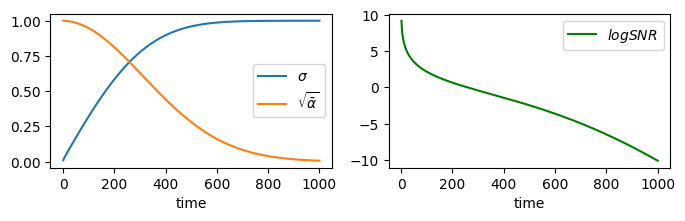

In [8]:
fig, ax = plt.subplots(1, 2, figsize=(4 * 2, 2))

# plot how sqrt_alpha_bar and sigma change over time
ax[0].plot(ts.numpy(), process.sigma(ts), label=r'$\sigma$')
ax[0].plot(ts.numpy(), process.sqrt_alpha_bar(ts), label=r'$\sqrt{\bar\alpha}$')
ax[0].set_xlabel('time')
ax[0].legend()

# It is often helpful to reason in terms of signal-to-noise ratio:
# SNR = sqrt_alpha_bar(t)^2 / sigma(t)^2 or more conveniently, its logarithm.
# High SNR = little noise, low SNR = a lot of noise.
lambda_ = [2. * np.log(process.sqrt_alpha_bar(t) / process.sigma(t)) for t in ts]
ax[1].plot(ts.numpy(), lambda_, c='g', label=r'$log SNR$')
ax[1].set_xlabel('time')
ax[1].legend()

plt.show()

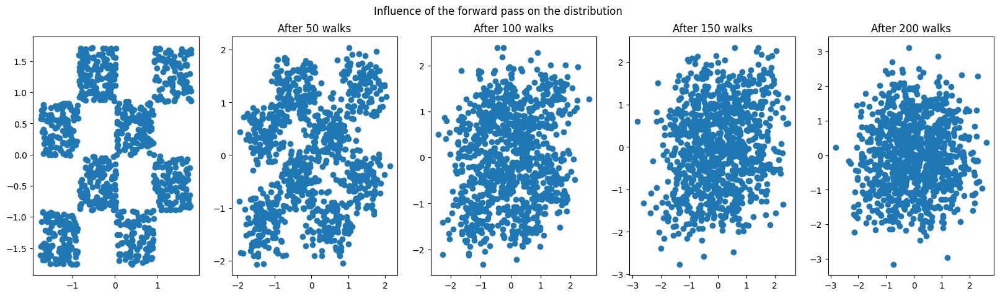

In [9]:
# Effect on the distribution
torch_test_data = torch.Tensor(test_data)
def apply_on_dataset(dataset,t):
    dataset_t = torch.zeros_like(dataset)
    for i in range(dataset.shape[0]):
        point = dataset[i]
        eps = torch.randn_like(point)
        point_t = process.sample(point, t, eps)
        dataset_t[i] = point_t
    return dataset_t

fig,axes = plt.subplots(1,5,figsize=(20,5))
axes[0].scatter(torch_test_data[:,0],torch_test_data[:,1])
for i in range(1,5):
    t = torch.Tensor([i*50]).type(torch.int64)
    dataset_t = apply_on_dataset(torch_test_data,t)
    axes[i].scatter(dataset_t[:,0],dataset_t[:,1])
    axes[i].set_title(f"After {t.detach().item()} walks")
fig.suptitle("Influence of the forward pass on the distribution")
plt.show()



#### Backward Process

Hypothetically, We would like  to train the reverse kernel $p_\theta\left(\mathbf{x}_{t-1} \mid \mathbf{x}_t\right)$, with parameters $\theta$ parametrized by a neural network

$$
p_\theta\left(\mathbf{x}_{0: T}\right):=p\left(\mathbf{x}_T\right) \prod_{t=1}^T p_\theta\left(\mathbf{x}_{t-1} \mid \mathbf{x}_t\right)
$$

with $p(\mathbf{x}_T)$ a Gaussian prior, $p(\mathbf{x}_T) \sim \mathcal{N}(0,I)$ . We would use $p(\mathbf{x}_T)$ to sample new data points for generation.

#### Variational Lower Bound

In the paper, they used the knowledge of the forward pass and design a  Gaussian  reverse kernel

$$
p_\theta\left(\mathbf{x}_{t-1} \mid \mathbf{x}_t\right)=\mathcal{N}\left(\mathbf{x}_{t-1} ; \mu_\theta\left(\mathbf{x}_t, t\right), \Sigma_\theta\left(\mathbf{x}_t, t\right)\right)
$$

with $\mu_{\theta}$ and $\Sigma_{\theta}$  parametrized by a neural network

We can write the previous forward kernel
$$
\begin{aligned}
q\left(\mathbf{x}_t \mid \mathbf{x}_0\right) & =\mathcal{N}\left(\mathbf{x}_t ; \sqrt{\bar{\alpha}_t} \mathbf{x}_0,\left(1-\bar{\alpha}_t\right) \mathbf{I}\right) \\
& =\sqrt{\bar{\alpha}_t} \mathbf{x}_0+\epsilon \sqrt{1-\bar{\alpha}_t}
\end{aligned}
$$
with $ \epsilon \sim \mathcal{N}(0, \mathbf{I})$

The natural loss would be to optimize under the variational lower bound $L_t$ such that :
$$
\begin{aligned}
L_{\mathrm{vlb}} & :=L_0+L_1+\ldots+L_{T-1}+L_T \\
L_0 & :=-\log p_\theta\left(x_0 \mid x_1\right) \\
L_{t-1} & :=D_{K L}\left(q\left(x_{t-1} \mid x_t, x_0\right) \| p_\theta\left(x_{t-1} \mid x_t\right)\right) \\
L_T & :=D_{K L}\left(q\left(x_T \mid x_0\right) \| p\left(x_T\right)\right)
\end{aligned}
$$

One can show that an alternative loss can be used that only take one parametrized estimator $\epsilon_{\theta}$. \
Hint: KL divergences between Gaussian distributions can be computed analytically
$$
L_{\text {simple }}(\theta):=\mathbb{E}_{t, \mathbf{x}_0, \boldsymbol{\epsilon}}\left[\left\|\boldsymbol{\epsilon}-\boldsymbol{\epsilon}_\theta\left(\sqrt{\bar{\alpha}_t} \mathbf{x}_0+\sqrt{1-\bar{\alpha}_t} \boldsymbol{\epsilon}, t\right)\right\|^2\right]
$$

Let's start implementing the network that predicts $\widehat \epsilon(x_t, t; \theta)$. Note that, as stated by its definition, $\epsilon$ is the cumulated noise from $t=0$ and not just the noise added at the last step.

In [10]:
import torch.nn as nn

class ResidualMLP(nn.Module):
    """MLP with residual connections."""

    def __init__(
        self,
        n_blocks: int,
        n_hidden: int,
        n_out: int,
        activation: str,
        name: str = None
    ):
        super(ResidualMLP, self).__init__()
        self._n_blocks = n_blocks
        self._n_hidden = n_hidden
        self._n_out = n_out
        self._activation = getattr(nn.functional, activation)

        self.linear_input = nn.Linear(n_out, n_hidden)
        self.linear_time = nn.ModuleList([nn.Linear(n_hidden, n_hidden) for _ in range(self._n_blocks)])
        self.linear_hidden = nn.Sequential(
    nn.ModuleList([nn.Linear(n_hidden, n_hidden) for _ in range(self._n_blocks)]),
    nn.ModuleList([nn.Linear(n_hidden, n_hidden) for _ in range(self._n_blocks)])
        )
        self.linear_output = nn.Linear(n_hidden, n_out)

    def forward(self, xt: torch.Tensor, time: torch.Tensor) -> torch.Tensor:
        x = self.linear_input(xt)

        for _ in range(self._n_blocks):
            h=self._activation(x)
            h=self.linear_hidden[_][0](h)
            h=h+self.linear_time[_](time)
            h=self._activation(h)
            h=self.linear_hidden[_][1](h)
            x=x+h

        outputs = self.linear_output(x)

        return outputs


#### Time embeddings

As we can see above, the denoiser network needs to get timestep $t$ as an input.

However, feeding integers $t=1, 2, ... T$ into the network will not work.

[Transformers](https://arxiv.org/abs/1706.03762), when faced with the same problem, proposed to embed timesteps into $d$-dimensional vectors of sinusoids:

$$e = [\; \sin(w_1 t) \; \; \cos(w_1 t) \; ... \; \sin(w_{d/2} t) \; \; \cos(w_{d/2} t) \;]$$

with $w_i = 1/ 10000^{\frac{2i}{d}}$.

Here is nice blogpost with more intuition: https://kazemnejad.com/blog/transformer_architecture_positional_encoding/


In [11]:
class SinusoidalTimeEmbedding(nn.Module):
    """Time (positional) embedding as in Transformers."""

    def __init__(self, num_features: int, name: str = None):
        super(SinusoidalTimeEmbedding, self).__init__()
        self._num_features = num_features

    def forward(self, inputs: torch.Tensor) -> torch.Tensor:
        assert len(inputs.shape) == 1
        half_dim = self._num_features // 2
        e = torch.log(torch.tensor(10000.0)) / (half_dim - 1)
        embedding = torch.exp(-e * torch.arange(half_dim).float()).to(device)
        embedding = inputs.view(-1, 1) * embedding
        embedding = torch.cat([torch.cos(embedding), torch.sin(embedding)], dim=-1)
        if self._num_features % 2 == 1:
            embedding = nn.functional.pad(embedding, (0, 1))
        return embedding


Now we need to put the two modules together:

In [12]:
import dataclasses

@dataclasses.dataclass
class NetConfig:
    resnet_n_blocks: int = 2
    resnet_n_hidden: int = 256
    resnet_n_out: int = 2
    activation: str = 'elu'
    time_embedding_dim: int = 256


class Net(nn.Module):
    """Combines MLP and time embeddings."""
    def __init__(self, net_config: NetConfig, name: str = None):
        super(Net, self).__init__()

        self._time_encoder = SinusoidalTimeEmbedding(net_config.time_embedding_dim)
        self._predictor = ResidualMLP(
            n_blocks=net_config.resnet_n_blocks,
            n_hidden=net_config.resnet_n_hidden,
            n_out=net_config.resnet_n_out,
            activation=net_config.activation
        )

    def forward(self, noisy_data: torch.Tensor, time: torch.Tensor) -> torch.Tensor:
        time_embedding = self._time_encoder(time)
        outputs = self._predictor(noisy_data, time_embedding)
        return outputs


#### Time sampler

To compute our loss function, for each example, we need to sample a random timestep. In this trivial case of uniform sampling between step 1 and T, it might be an overkill to implement it as a separate class. It would be more helpful if you're going to explore more exotic diffusion models.

In [13]:
from typing import Sequence

class UniformDiscreteTimeSampler:

    def __init__(self, tmin: int, tmax: int):
        self._tmin = tmin
        self._tmax = tmax

    def sample(self, shape: Sequence[int]) -> torch.Tensor:
        return torch.randint(low=self._tmin, high=self._tmax, size=shape)


#### Full DDPM model

**Q.23 Implement the Simplified loss given a model $\epsilon_{\theta}$**

$$
L_{\text {simple }}(\theta):=\mathbb{E}_{t, \mathbf{x}_0, \boldsymbol{\epsilon}}\left[\left\|\boldsymbol{\epsilon}-\boldsymbol{\epsilon}_\theta\left(\sqrt{\bar{\alpha}_t} \mathbf{x}_0+\sqrt{1-\bar{\alpha}_t} \boldsymbol{\epsilon}, t\right)\right\|^2\right]
$$

In [48]:
class DiffusionModel(nn.Module):
    """Diffusion model."""

    def __init__(self, diffusion_process, time_sampler, net_config, data_shape):
        super(DiffusionModel, self).__init__()

        self._process = diffusion_process
        self._time_sampler = time_sampler
        self._net_config = net_config
        self._data_shape = data_shape
        self.net_fwd = Net(net_config)

    def loss(self, x0: torch.Tensor) -> torch.Tensor:
        """Computes MSE between the true noise and predicted noise,
        i.e. the goal of the network is to correctly predict eps from a noisy observation
        xt = alpha(t) * x0 + sigma(t)**2 * eps"""

        ###############
        # TO COMPLETE #
        ###############
        t = self._time_sampler.sample((x0.shape[0],))
        eps = torch.randn_like(x0).to(device) # sample noise

        mu = self._process.sqrt_alpha_bar(t).unsqueeze(1).to(device) * x0
        sigma = self._process.sigma(t).unsqueeze(1).to(device)
        xt = mu + sigma * eps

        # beta_t = torch.tensor(self._process._betas[t], dtype=torch.float32)
        # alpha_t = 1 - beta_t
        # alpha_t = bcast_right(alpha_t, x0.ndim).to(device)

        # sigma_t = self._process.sigma(t)
        # sigma_t = bcast_right(sigma_t, x0.ndim).to(device)

        # # Corrupt the data for each sample in the batch
        # xt = alpha_t * x0 + (sigma_t**2) * eps

        # Forward pass through the network for each sample in the batch
        net_outputs = self.net_fwd(xt, t.to(device))
        # Compute difference and loss for each sample in the batch
        loss = torch.sum((eps.to(device) - net_outputs) ** 2) / x0.shape[0]  # Mean over the batch

        return loss

    #Used for sampling
    #Return a tuple [torch.Tensor, torch.Tensor]
    def _reverse_process_step(
        self,
        xt: torch.Tensor,
        t: int,
    ):
        """Computes parameters of a Gaussian p_{\theta}(x_{t-1}| x_t)."""

        t = t * torch.ones((xt.shape[0],), dtype=torch.int32, device=xt.device)

        ###############
        # TO COMPLETE #
        ###############
        eps_pred = self.net_fwd(xt, t)  # predict epsilon from x_t

        # sqrt_alpha_t = self._process._sqrt_alphas_bar[t.cpu()] # use self._sqrt_alpha_bar
        # inv_sqrt_alpha_t = bcast_right(1.0 / sqrt_alpha_t, xt.ndim).to(device)


        beta_t = torch.tensor(self._process._betas[t.cpu()], dtype=torch.float32)
        beta_t = bcast_right(beta_t, xt.ndim).to(device)

        alpha_t = 1.0 - beta_t
        inv_sqrt_alpha_t = 1.0 / torch.sqrt(alpha_t)

        inv_sigma_t = 1.0 / self._process.sigma(t.cpu())
        inv_sigma_t = bcast_right(inv_sigma_t, xt.ndim).to(device)

        mean = inv_sqrt_alpha_t * (xt - (beta_t * inv_sigma_t) * eps_pred)

        # DDPM instructs to use either the variance of the forward process
        # or the variance of q(x_{t-1}|x_t, x_0). Former is easier.
        std = torch.sqrt(beta_t).to(device)
        eps = torch.randn_like(xt).to(device)

        return (mean, mean + std*eps)


    def sample(self, x0, sample_size):
        """To generate samples from DDPM, we follow the reverse process.
        At each step of the chain, we sample x_{t-1} from p(x_{t-1}| x_t, x0_pred) until we get to x_0."""

        with torch.no_grad():

            x = torch.randn((sample_size,) + self._data_shape, device=x0.device) #sample pure noise

            T = self._process._num_diffusion_timesteps - 1
            for _ in range(T):
              x = self._reverse_process_step(x, T)[1]
              T -= 1

            ###############
            # TO COMPLETE #
            ###############

        return x

Given the noise obtained by the model $\boldsymbol{\epsilon}_\theta\left(\mathbf{x}_t, t\right)$, you can sample $\mu_{\theta}(\mathbf{x}_t,t)$ in order to get a denoised sample point.
$$
\mu_{\theta}(\mathbf{x}_t,t) = \frac{1}{\sqrt{\alpha_t}}\left(\mathbf{x}_t-\frac{\beta_t}{\sqrt{1-\bar{\alpha}_t}} \boldsymbol{\epsilon}_\theta\left(\mathbf{x}_t, t\right)\right)
$$


The _reverse_process_step function sample $x_{t-1} \sim p_\theta\left(\mathbf{x}_{t-1} \mid \mathbf{x}_t\right)$ where
$$
p_\theta\left(\mathbf{x}_{t-1} \mid \mathbf{x}_t\right)=\mathcal{N}\left(\mathbf{x}_{t-1} ; \mu_\theta\left(\mathbf{x}_t, t\right), \Sigma_\theta\left(\mathbf{x}_t, t\right)\right)
$$
and we set $$\Sigma_\theta\left(\mathbf{x}_t, t\right) = \beta_{t}\boldsymbol{I}$$

Thus $$x_{t-1} = \mu_{\theta}(\mathbf{x}_t,t) + \sqrt{\beta_t}\epsilon$$ where $$\epsilon \sim \mathcal{N}(\mathbf{0}, \mathbf{I})$$

**Q.24 Build the sampling function that allows you from inputs $\mathbf{x}_t$ and $t$ to obtain $\mu_{\theta}(\mathbf{x}_t,t)$ and $x_{t-1}$**

#### Training

In [49]:
from torch import optim

# create the model
diffusion_process = DiscreteDDPMProcess(num_diffusion_timesteps=1000)
time_sampler = UniformDiscreteTimeSampler(diffusion_process.tmin, diffusion_process.tmax)
model = DiffusionModel(diffusion_process, time_sampler, net_config=NetConfig(), data_shape=(2,)).to(device)
optimizer = optim.Adam(model.parameters(), lr=3e-4)

We will use a learning rate scheduler with a warmup. \
You will have to install the library pytorch_warmup with "pip install -U pytorch_warmup": https://github.com/Tony-Y/pytorch_warmup \
Our learning rate schedule will have the following shape.

![Denoisingdiagram](https://www.lri.fr/~gcharpia/deeppractice/2024/TP6/lr_with_warmup.png)

In [37]:
!pip install -U pytorch_warmup

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 63.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 62.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 95.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 30.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 87.9 MB/s eta 0:00:00


In [50]:
import pytorch_warmup as warmup

training_steps = 50000

warmup_period=1000 #this is the increasing part of the learning rate schedule
num_steps = training_steps
t0 = num_steps // 1
lr_min = 3e-12
max_step = t0 * 1 + warmup_period #you can also create cycle but we won't touch it here

lr_scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, T_0=t0, T_mult=1, eta_min=lr_min)

warmup_scheduler = warmup.LinearWarmup(optimizer, warmup_period)


##### Training loop

**Q.25 Train $\epsilon_{\theta}(\mathbf{x},t)$ that take as entry a transformed vector $\mathbf{x}$ and  $t$ a number of time $\mathbf{x}$ passed through the forward process  and return  a direct estimate of  the noise $\epsilon$**

Step: 0, Loss: 3.34268


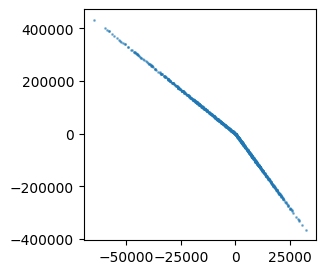

Step: 1000, Loss: 0.52139
Step: 2000, Loss: 0.50930
Step: 3000, Loss: 0.56536
Step: 4000, Loss: 0.53056
Step: 5000, Loss: 0.52976
Step: 6000, Loss: 0.56648
Step: 7000, Loss: 0.49495
Step: 8000, Loss: 0.54381
Step: 9000, Loss: 0.51341
Step: 10000, Loss: 0.49132


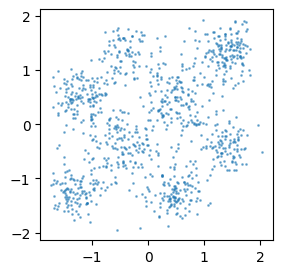

Step: 11000, Loss: 0.46798
Step: 12000, Loss: 0.52743
Step: 13000, Loss: 0.48509
Step: 14000, Loss: 0.52743
Step: 15000, Loss: 0.48450
Step: 16000, Loss: 0.54854
Step: 17000, Loss: 0.50626
Step: 18000, Loss: 0.53727
Step: 19000, Loss: 0.48828
Step: 20000, Loss: 0.51258


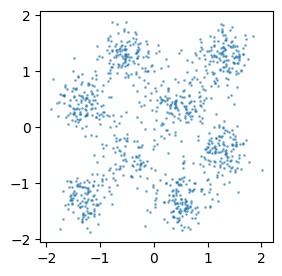

Step: 21000, Loss: 0.50938
Step: 22000, Loss: 0.46907
Step: 23000, Loss: 0.53620
Step: 24000, Loss: 0.49888
Step: 25000, Loss: 0.53502
Step: 26000, Loss: 0.51695
Step: 27000, Loss: 0.49086
Step: 28000, Loss: 0.52590
Step: 29000, Loss: 0.55466
Step: 30000, Loss: 0.46980


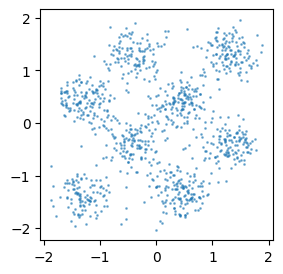

Step: 31000, Loss: 0.54087
Step: 32000, Loss: 0.52402
Step: 33000, Loss: 0.49050
Step: 34000, Loss: 0.54014
Step: 35000, Loss: 0.51221
Step: 36000, Loss: 0.49335
Step: 37000, Loss: 0.46315
Step: 38000, Loss: 0.47061
Step: 39000, Loss: 0.53317
Step: 40000, Loss: 0.48461


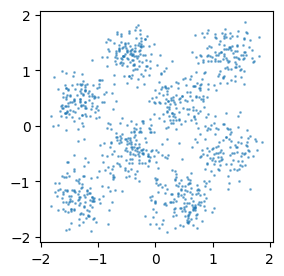

Step: 41000, Loss: 0.50521
Step: 42000, Loss: 0.45479
Step: 43000, Loss: 0.50447
Step: 44000, Loss: 0.46949
Step: 45000, Loss: 0.52887
Step: 46000, Loss: 0.51549
Step: 47000, Loss: 0.57399
Step: 48000, Loss: 0.47543
Step: 49000, Loss: 0.52131
Step: 50000, Loss: 0.54962


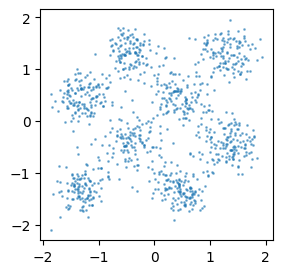

In [51]:
BATCH_SIZE=1024

for step in range(training_steps+1):
    #generate batch on the fly

    train_data = generate_batch(BATCH_SIZE)
    x = torch.Tensor(train_data).to(device)
    optimizer.zero_grad()
    loss = model.loss(x)
    loss.backward()
    optimizer.step()

    ###############
    # TO COMPLETE #
    ###############

    if step % 1000 == 0:
        print(f'Step: {step}, Loss: {loss:.5f}')

    if step % 10000 == 0:
        with torch.no_grad():
            samples = model.sample(x, BATCH_SIZE) # create new samples
        plt.figure(figsize=(3, 3))
        plt.scatter(samples[:, 0].cpu(), samples[:, 1].cpu(), s=1, alpha=0.5)
        plt.show()

    with warmup_scheduler.dampening():
        if warmup_scheduler.last_step + 1 >= warmup_period:
            lr_scheduler.step()
        if warmup_scheduler.last_step + 1 >= max_step:
            break


#### Ablation study

**Q.26 Perform ablations experiments on hyperparameters, such as: learning rate (try constant learning rate with different values), batch size, the number of timesteps, the positional embedding for timestep (remove it), the hidden size, number of epochs, skip connections**

For a given ablation experiment (they ought to be done separately!), you should plot generated samples at few given timesteps (if compute resources is limited, do it for one timestep).

Note: you don't have to do all of these experiments, but the bigger is your group, the more you should do.

**Experiment 1: constant learning rate**

In [54]:
from torch import optim
# create the model
diffusion_process = DiscreteDDPMProcess(num_diffusion_timesteps=1000)
time_sampler = UniformDiscreteTimeSampler(diffusion_process.tmin, diffusion_process.tmax)
model = DiffusionModel(diffusion_process, time_sampler, net_config=NetConfig(), data_shape=(2,)).to(device)
optimizer = optim.Adam(model.parameters(), lr=3e-4)

Step: 0, Loss: 2.49592


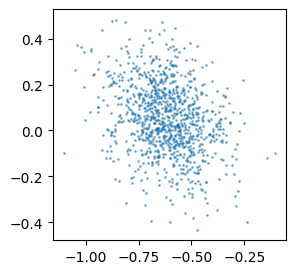

Step: 1000, Loss: 0.55791
Step: 2000, Loss: 0.53063
Step: 3000, Loss: 0.49297
Step: 4000, Loss: 0.50461
Step: 5000, Loss: 0.51486
Step: 6000, Loss: 0.52660
Step: 7000, Loss: 0.50055
Step: 8000, Loss: 0.49178
Step: 9000, Loss: 0.49678
Step: 10000, Loss: 0.49961


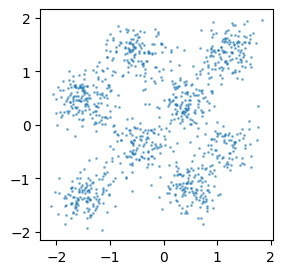

Step: 11000, Loss: 0.49117
Step: 12000, Loss: 0.50187
Step: 13000, Loss: 0.52131
Step: 14000, Loss: 0.60912
Step: 15000, Loss: 0.49901
Step: 16000, Loss: 0.53613
Step: 17000, Loss: 0.50491
Step: 18000, Loss: 0.53584
Step: 19000, Loss: 0.50800
Step: 20000, Loss: 0.52589


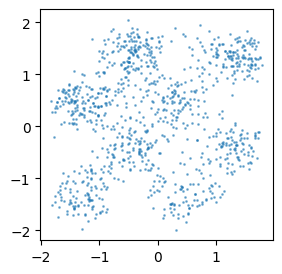

Step: 21000, Loss: 0.54751
Step: 22000, Loss: 0.50346
Step: 23000, Loss: 0.51670
Step: 24000, Loss: 0.53917
Step: 25000, Loss: 0.47435
Step: 26000, Loss: 0.47747
Step: 27000, Loss: 0.50997
Step: 28000, Loss: 0.49053
Step: 29000, Loss: 0.46293
Step: 30000, Loss: 0.53510


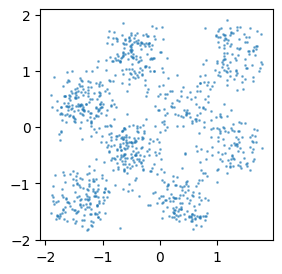

Step: 31000, Loss: 0.55158
Step: 32000, Loss: 0.52138
Step: 33000, Loss: 0.50402
Step: 34000, Loss: 0.51270
Step: 35000, Loss: 0.47610
Step: 36000, Loss: 0.53563
Step: 37000, Loss: 0.57899
Step: 38000, Loss: 0.45438
Step: 39000, Loss: 0.51715
Step: 40000, Loss: 0.53345


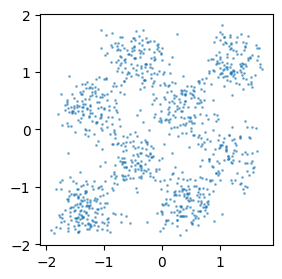

Step: 41000, Loss: 0.48103
Step: 42000, Loss: 0.51359
Step: 43000, Loss: 0.58322
Step: 44000, Loss: 0.46538
Step: 45000, Loss: 0.44555
Step: 46000, Loss: 0.51602
Step: 47000, Loss: 0.47927
Step: 48000, Loss: 0.47252
Step: 49000, Loss: 0.48834
Step: 50000, Loss: 0.50973


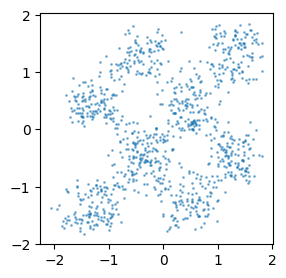

Learning rate - 0.003: mean_loss=0.51354, lowest_loss=0.38826
Step: 0, Loss: 2.60369


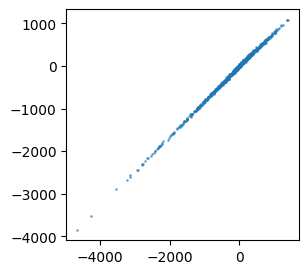

Step: 1000, Loss: 0.55322
Step: 2000, Loss: 0.54556
Step: 3000, Loss: 0.56817
Step: 4000, Loss: 0.50232
Step: 5000, Loss: 0.51536
Step: 6000, Loss: 0.51880
Step: 7000, Loss: 0.51773
Step: 8000, Loss: 0.48456
Step: 9000, Loss: 0.48338
Step: 10000, Loss: 0.46652


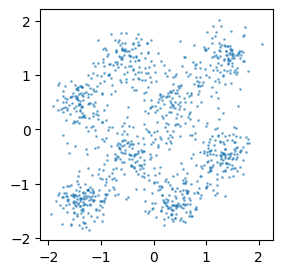

Step: 11000, Loss: 0.53259
Step: 12000, Loss: 0.46123
Step: 13000, Loss: 0.48114
Step: 14000, Loss: 0.54459
Step: 15000, Loss: 0.49341
Step: 16000, Loss: 0.50566
Step: 17000, Loss: 0.50254
Step: 18000, Loss: 0.48397
Step: 19000, Loss: 0.49648
Step: 20000, Loss: 0.51242


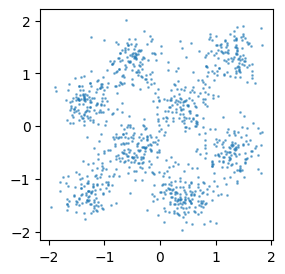

Step: 21000, Loss: 0.46631
Step: 22000, Loss: 0.42897
Step: 23000, Loss: 0.49694
Step: 24000, Loss: 0.58284
Step: 25000, Loss: 0.42022
Step: 26000, Loss: 0.51147
Step: 27000, Loss: 0.46137
Step: 28000, Loss: 0.47173
Step: 29000, Loss: 0.53306
Step: 30000, Loss: 0.50921


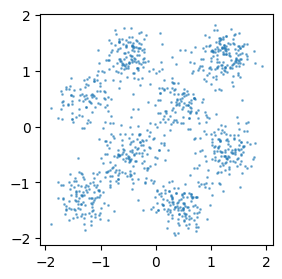

Step: 31000, Loss: 0.51137
Step: 32000, Loss: 0.51863
Step: 33000, Loss: 0.49317
Step: 34000, Loss: 0.52226
Step: 35000, Loss: 0.54871
Step: 36000, Loss: 0.48156
Step: 37000, Loss: 0.54034
Step: 38000, Loss: 0.47232
Step: 39000, Loss: 0.46232
Step: 40000, Loss: 0.48131


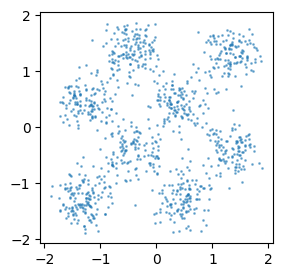

Step: 41000, Loss: 0.49163
Step: 42000, Loss: 0.51088
Step: 43000, Loss: 0.50828
Step: 44000, Loss: 0.51556
Step: 45000, Loss: 0.51558
Step: 46000, Loss: 0.49435
Step: 47000, Loss: 0.49635
Step: 48000, Loss: 0.48055
Step: 49000, Loss: 0.52970
Step: 50000, Loss: 0.51199


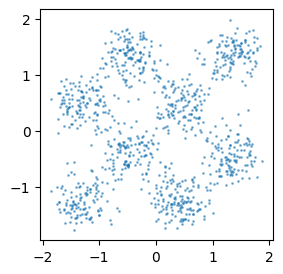

Learning rate - 0.0003: mean_loss=0.50618, lowest_loss=0.38460
Step: 0, Loss: 3.43900


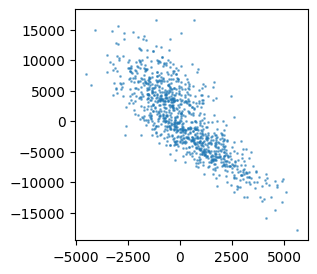

Step: 1000, Loss: 0.58537
Step: 2000, Loss: 0.51625
Step: 3000, Loss: 0.59606
Step: 4000, Loss: 0.52970
Step: 5000, Loss: 0.51694
Step: 6000, Loss: 0.52762
Step: 7000, Loss: 0.49000
Step: 8000, Loss: 0.54857
Step: 9000, Loss: 0.55732
Step: 10000, Loss: 0.53733


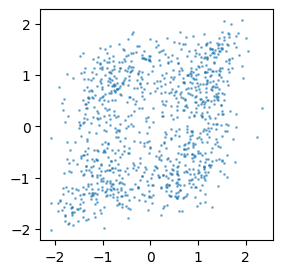

Step: 11000, Loss: 0.57398
Step: 12000, Loss: 0.53303
Step: 13000, Loss: 0.53537
Step: 14000, Loss: 0.57192
Step: 15000, Loss: 0.55185
Step: 16000, Loss: 0.52981
Step: 17000, Loss: 0.58093
Step: 18000, Loss: 0.55106
Step: 19000, Loss: 0.46872
Step: 20000, Loss: 0.50935


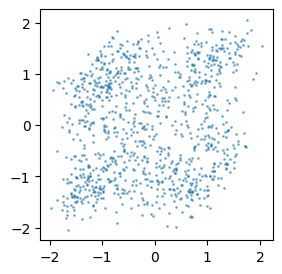

Step: 21000, Loss: 0.57211
Step: 22000, Loss: 0.47458
Step: 23000, Loss: 0.52044
Step: 24000, Loss: 0.49423
Step: 25000, Loss: 0.53404
Step: 26000, Loss: 0.54266
Step: 27000, Loss: 0.49852
Step: 28000, Loss: 0.51434
Step: 29000, Loss: 0.49749
Step: 30000, Loss: 0.51569


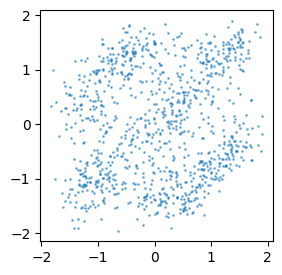

Step: 31000, Loss: 0.55697
Step: 32000, Loss: 0.54607
Step: 33000, Loss: 0.48942
Step: 34000, Loss: 0.47993
Step: 35000, Loss: 0.50461
Step: 36000, Loss: 0.49315
Step: 37000, Loss: 0.45104
Step: 38000, Loss: 0.47535
Step: 39000, Loss: 0.46295
Step: 40000, Loss: 0.58209


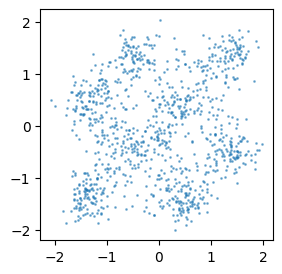

Step: 41000, Loss: 0.52651
Step: 42000, Loss: 0.52547
Step: 43000, Loss: 0.42828
Step: 44000, Loss: 0.51181
Step: 45000, Loss: 0.50472
Step: 46000, Loss: 0.49252
Step: 47000, Loss: 0.50390
Step: 48000, Loss: 0.49429
Step: 49000, Loss: 0.47479
Step: 50000, Loss: 0.50405


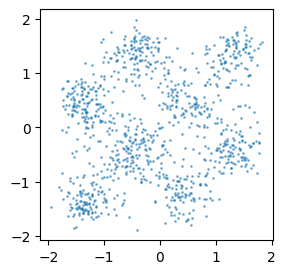

Learning rate - 3e-05: mean_loss=0.51914, lowest_loss=0.38579
Step: 0, Loss: 2.62895


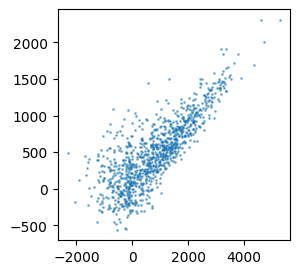

Step: 1000, Loss: 0.66759
Step: 2000, Loss: 0.69429
Step: 3000, Loss: 0.60963
Step: 4000, Loss: 0.52532
Step: 5000, Loss: 0.51290
Step: 6000, Loss: 0.56963
Step: 7000, Loss: 0.55482
Step: 8000, Loss: 0.52750
Step: 9000, Loss: 0.54061
Step: 10000, Loss: 0.54319


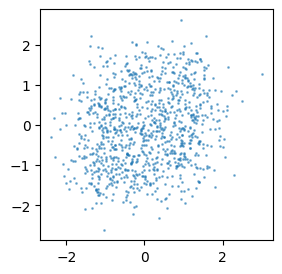

Step: 11000, Loss: 0.49529
Step: 12000, Loss: 0.51382
Step: 13000, Loss: 0.53229
Step: 14000, Loss: 0.49502
Step: 15000, Loss: 0.63083
Step: 16000, Loss: 0.52528
Step: 17000, Loss: 0.52114
Step: 18000, Loss: 0.57118
Step: 19000, Loss: 0.55460
Step: 20000, Loss: 0.53384


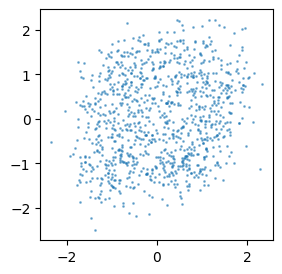

Step: 21000, Loss: 0.52933
Step: 22000, Loss: 0.53253
Step: 23000, Loss: 0.53655
Step: 24000, Loss: 0.50387
Step: 25000, Loss: 0.52481
Step: 26000, Loss: 0.58287
Step: 27000, Loss: 0.55776
Step: 28000, Loss: 0.55614
Step: 29000, Loss: 0.52110
Step: 30000, Loss: 0.53036


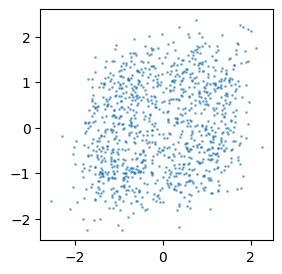

Step: 31000, Loss: 0.52900
Step: 32000, Loss: 0.58570
Step: 33000, Loss: 0.53606
Step: 34000, Loss: 0.53690
Step: 35000, Loss: 0.53241
Step: 36000, Loss: 0.48683
Step: 37000, Loss: 0.52121
Step: 38000, Loss: 0.49708
Step: 39000, Loss: 0.54024
Step: 40000, Loss: 0.49127


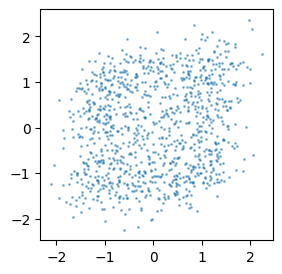

Step: 41000, Loss: 0.53852
Step: 42000, Loss: 0.48337
Step: 43000, Loss: 0.57015
Step: 44000, Loss: 0.48842
Step: 45000, Loss: 0.56966
Step: 46000, Loss: 0.52769
Step: 47000, Loss: 0.61235
Step: 48000, Loss: 0.55481
Step: 49000, Loss: 0.53065
Step: 50000, Loss: 0.54250


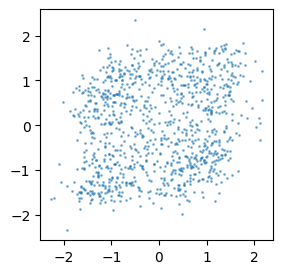

Learning rate - 3e-06: mean_loss=0.54584, lowest_loss=0.38805


In [66]:
learning_rates = [3e-3, 3e-4, 3e-5, 3e-6]
training_steps = 50000
BATCH_SIZE=1024
#######################################

for lr in learning_rates:

  model = DiffusionModel(diffusion_process, time_sampler, net_config=NetConfig(), data_shape=(2,)).to(device)
  optimizer = optim.Adam(model.parameters(), lr=lr)
  losses = []
  for step in range(training_steps+1):
      #generate batch on the fly
      train_data = generate_batch(BATCH_SIZE)
      x = torch.Tensor(train_data).to(device)
      optimizer.zero_grad()
      loss = model.loss(x)
      loss.backward()
      optimizer.step()

      losses.append(loss)

      if step % 1000 == 0:
          print(f'Step: {step}, Loss: {loss:.5f}')

      if step % 10000 == 0:
          with torch.no_grad():
              samples = model.sample(x, BATCH_SIZE) # create new samples
          plt.figure(figsize=(3, 3))
          plt.scatter(samples[:, 0].cpu(), samples[:, 1].cpu(), s=1, alpha=0.5)
          plt.show()

  min_loss = torch.min(torch.stack(losses)).item()
  mean_loss = torch.mean(torch.stack(losses)).item()
  print(f'Learning rate - {lr}: mean_loss={mean_loss:.5f}, lowest_loss={min_loss:.5f}')

**Experiment 2: Time steps**

Step: 0, Loss: 2.31408


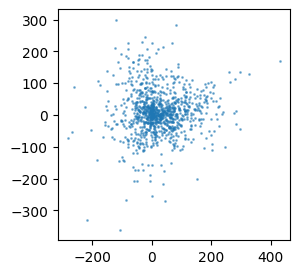

Step: 1000, Loss: 0.51791
Step: 2000, Loss: 0.48519
Step: 3000, Loss: 0.47907
Step: 4000, Loss: 0.52402
Step: 5000, Loss: 0.54935
Step: 6000, Loss: 0.51518
Step: 7000, Loss: 0.51377
Step: 8000, Loss: 0.58535
Step: 9000, Loss: 0.47469
Step: 10000, Loss: 0.51757


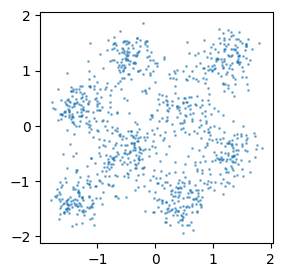

Step: 11000, Loss: 0.55160
Step: 12000, Loss: 0.52774
Step: 13000, Loss: 0.51691
Step: 14000, Loss: 0.49655
Step: 15000, Loss: 0.50710
Step: 16000, Loss: 0.49566
Step: 17000, Loss: 0.52325
Step: 18000, Loss: 0.46766
Step: 19000, Loss: 0.47587
Step: 20000, Loss: 0.48951


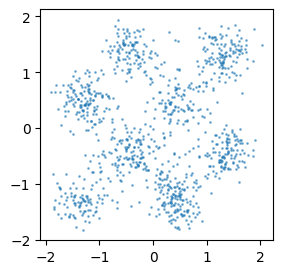

Step: 21000, Loss: 0.46958
Step: 22000, Loss: 0.44372
Step: 23000, Loss: 0.49518
Step: 24000, Loss: 0.51089
Step: 25000, Loss: 0.54851
Step: 26000, Loss: 0.50556
Step: 27000, Loss: 0.45431
Step: 28000, Loss: 0.51776
Step: 29000, Loss: 0.51472
Step: 30000, Loss: 0.51088


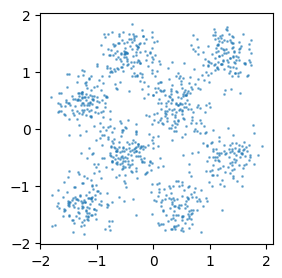

Step: 31000, Loss: 0.45866
Step: 32000, Loss: 0.49258
Step: 33000, Loss: 0.52124
Step: 34000, Loss: 0.52603
Step: 35000, Loss: 0.54419
Step: 36000, Loss: 0.54358
Step: 37000, Loss: 0.47578
Step: 38000, Loss: 0.50182
Step: 39000, Loss: 0.53634
Step: 40000, Loss: 0.48026


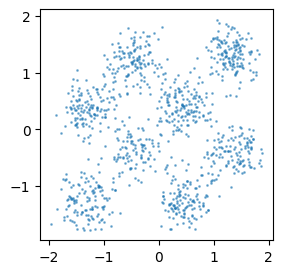

Step: 41000, Loss: 0.52814
Step: 42000, Loss: 0.53381
Step: 43000, Loss: 0.59512
Step: 44000, Loss: 0.48026
Step: 45000, Loss: 0.45932
Step: 46000, Loss: 0.51517
Step: 47000, Loss: 0.56647
Step: 48000, Loss: 0.47560
Step: 49000, Loss: 0.48675
Step: 50000, Loss: 0.51127


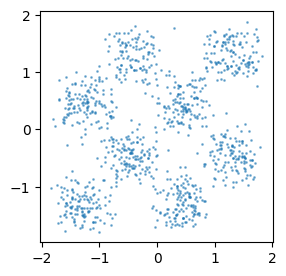

Learning rate - 3e-06: mean_loss=0.50589, lowest_loss=0.36638
Step: 0, Loss: 1.67903


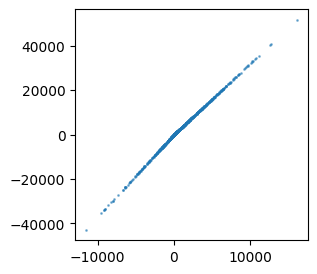

Step: 1000, Loss: 0.38139
Step: 2000, Loss: 0.39057
Step: 3000, Loss: 0.35505
Step: 4000, Loss: 0.38376
Step: 5000, Loss: 0.37054
Step: 6000, Loss: 0.38338
Step: 7000, Loss: 0.40070
Step: 8000, Loss: 0.38875
Step: 9000, Loss: 0.35754
Step: 10000, Loss: 0.34862


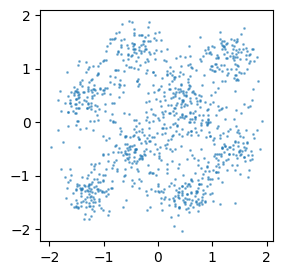

Step: 11000, Loss: 0.36237
Step: 12000, Loss: 0.37283
Step: 13000, Loss: 0.35016
Step: 14000, Loss: 0.43052
Step: 15000, Loss: 0.31866
Step: 16000, Loss: 0.32046
Step: 17000, Loss: 0.35376
Step: 18000, Loss: 0.36866
Step: 19000, Loss: 0.33774
Step: 20000, Loss: 0.32341


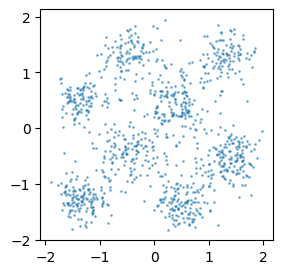

Step: 21000, Loss: 0.32389
Step: 22000, Loss: 0.37389
Step: 23000, Loss: 0.35195
Step: 24000, Loss: 0.34788
Step: 25000, Loss: 0.40912
Step: 26000, Loss: 0.37306
Step: 27000, Loss: 0.32745
Step: 28000, Loss: 0.35547
Step: 29000, Loss: 0.37595
Step: 30000, Loss: 0.36717


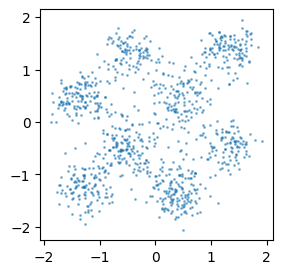

Step: 31000, Loss: 0.35797
Step: 32000, Loss: 0.40827
Step: 33000, Loss: 0.29911
Step: 34000, Loss: 0.37960
Step: 35000, Loss: 0.36956
Step: 36000, Loss: 0.33201
Step: 37000, Loss: 0.32334
Step: 38000, Loss: 0.30349
Step: 39000, Loss: 0.37590
Step: 40000, Loss: 0.39155


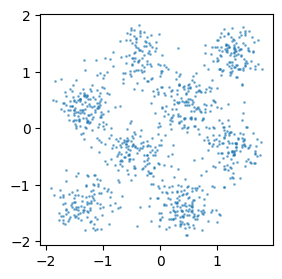

Step: 41000, Loss: 0.34928
Step: 42000, Loss: 0.40972
Step: 43000, Loss: 0.34214
Step: 44000, Loss: 0.39671
Step: 45000, Loss: 0.35349
Step: 46000, Loss: 0.38580
Step: 47000, Loss: 0.35049
Step: 48000, Loss: 0.39972
Step: 49000, Loss: 0.33808
Step: 50000, Loss: 0.34523


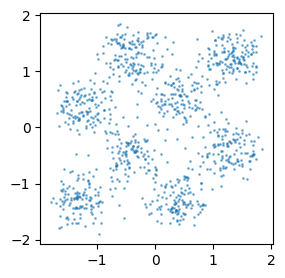

Learning rate - 3e-06: mean_loss=0.35617, lowest_loss=0.24944
Step: 0, Loss: 2.73270


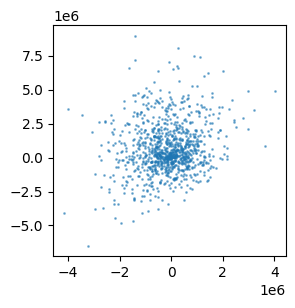

Step: 1000, Loss: 0.32925
Step: 2000, Loss: 0.30174
Step: 3000, Loss: 0.23513
Step: 4000, Loss: 0.30635
Step: 5000, Loss: 0.26940
Step: 6000, Loss: 0.27850
Step: 7000, Loss: 0.30943
Step: 8000, Loss: 0.29460
Step: 9000, Loss: 0.28396
Step: 10000, Loss: 0.29565


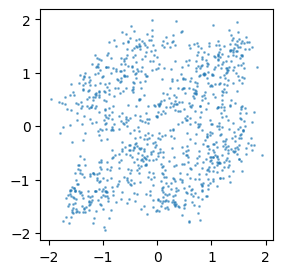

Step: 11000, Loss: 0.30932
Step: 12000, Loss: 0.28758
Step: 13000, Loss: 0.27760
Step: 14000, Loss: 0.30677
Step: 15000, Loss: 0.26591
Step: 16000, Loss: 0.26828
Step: 17000, Loss: 0.28674
Step: 18000, Loss: 0.24365
Step: 19000, Loss: 0.22494
Step: 20000, Loss: 0.30325


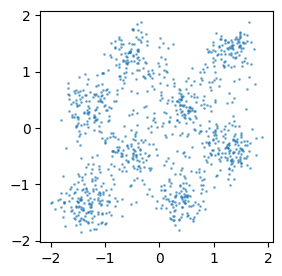

Step: 21000, Loss: 0.28227
Step: 22000, Loss: 0.27725
Step: 23000, Loss: 0.28262
Step: 24000, Loss: 0.33051
Step: 25000, Loss: 0.27158
Step: 26000, Loss: 0.26266
Step: 27000, Loss: 0.33291
Step: 28000, Loss: 0.27402
Step: 29000, Loss: 0.30137
Step: 30000, Loss: 0.30761


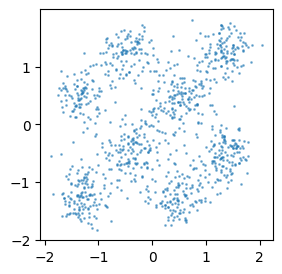

Step: 31000, Loss: 0.24929
Step: 32000, Loss: 0.28569
Step: 33000, Loss: 0.28310
Step: 34000, Loss: 0.27741
Step: 35000, Loss: 0.24958
Step: 36000, Loss: 0.29526
Step: 37000, Loss: 0.38078
Step: 38000, Loss: 0.26116
Step: 39000, Loss: 0.29498
Step: 40000, Loss: 0.28455


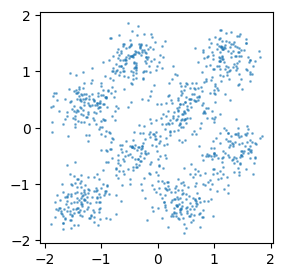

Step: 41000, Loss: 0.30076
Step: 42000, Loss: 0.26977
Step: 43000, Loss: 0.26520
Step: 44000, Loss: 0.28654
Step: 45000, Loss: 0.30609
Step: 46000, Loss: 0.31468
Step: 47000, Loss: 0.29947
Step: 48000, Loss: 0.30011
Step: 49000, Loss: 0.27100
Step: 50000, Loss: 0.28323


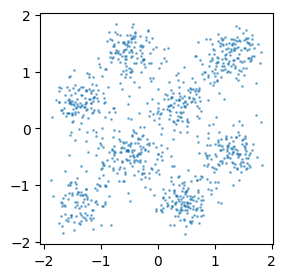

Learning rate - 3e-06: mean_loss=0.29055, lowest_loss=0.19812
Step: 0, Loss: 1.78664


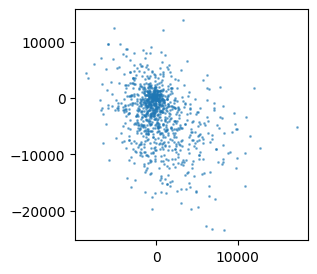

Step: 1000, Loss: 0.23669
Step: 2000, Loss: 0.30098
Step: 3000, Loss: 0.27314
Step: 4000, Loss: 0.26552
Step: 5000, Loss: 0.26311
Step: 6000, Loss: 0.32492
Step: 7000, Loss: 0.24718
Step: 8000, Loss: 0.25810
Step: 9000, Loss: 0.24066
Step: 10000, Loss: 0.25519


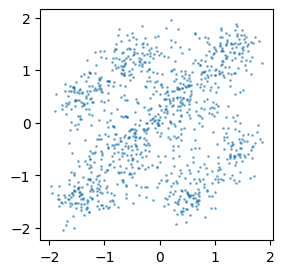

Step: 11000, Loss: 0.28228
Step: 12000, Loss: 0.30026
Step: 13000, Loss: 0.23452
Step: 14000, Loss: 0.24810
Step: 15000, Loss: 0.26757
Step: 16000, Loss: 0.20775
Step: 17000, Loss: 0.21996
Step: 18000, Loss: 0.22797
Step: 19000, Loss: 0.24531
Step: 20000, Loss: 0.28087


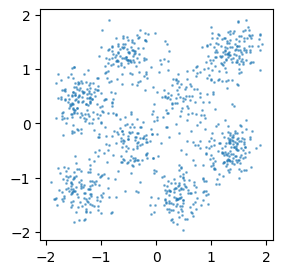

Step: 21000, Loss: 0.28906
Step: 22000, Loss: 0.23777
Step: 23000, Loss: 0.23614
Step: 24000, Loss: 0.25255
Step: 25000, Loss: 0.21488
Step: 26000, Loss: 0.23087
Step: 27000, Loss: 0.23644
Step: 28000, Loss: 0.22890
Step: 29000, Loss: 0.24597
Step: 30000, Loss: 0.23071


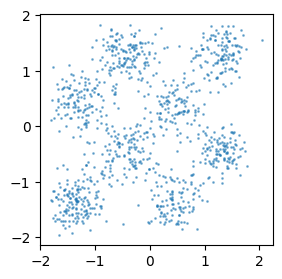

Step: 31000, Loss: 0.22987
Step: 32000, Loss: 0.26124
Step: 33000, Loss: 0.23313
Step: 34000, Loss: 0.24533
Step: 35000, Loss: 0.22397
Step: 36000, Loss: 0.29327
Step: 37000, Loss: 0.24187
Step: 38000, Loss: 0.26923
Step: 39000, Loss: 0.24917
Step: 40000, Loss: 0.22740


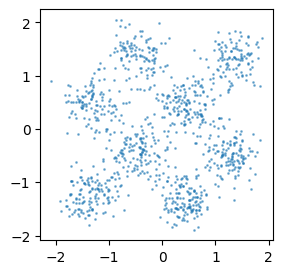

Step: 41000, Loss: 0.19929
Step: 42000, Loss: 0.25351
Step: 43000, Loss: 0.25076
Step: 44000, Loss: 0.23820
Step: 45000, Loss: 0.20152
Step: 46000, Loss: 0.23605
Step: 47000, Loss: 0.24837
Step: 48000, Loss: 0.26256
Step: 49000, Loss: 0.22375
Step: 50000, Loss: 0.23154


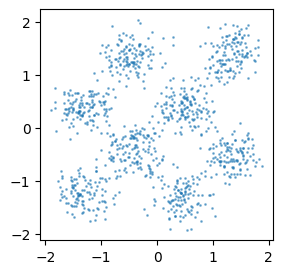

Learning rate - 3e-06: mean_loss=0.25007, lowest_loss=0.16065


In [67]:
time_steps = [1000, 2000, 3000, 4000]
training_steps = 50000
BATCH_SIZE=1024
#######################################

for ts in time_steps:

  diffusion_process = DiscreteDDPMProcess(num_diffusion_timesteps=ts)
  time_sampler = UniformDiscreteTimeSampler(diffusion_process.tmin, diffusion_process.tmax)
  model = DiffusionModel(diffusion_process, time_sampler, net_config=NetConfig(), data_shape=(2,)).to(device)
  optimizer = optim.Adam(model.parameters(), lr=3e-4)

  losses = []
  for step in range(training_steps+1):
      #generate batch on the fly
      train_data = generate_batch(BATCH_SIZE)
      x = torch.Tensor(train_data).to(device)
      optimizer.zero_grad()
      loss = model.loss(x)
      loss.backward()
      optimizer.step()

      losses.append(loss)

      if step % 1000 == 0:
          print(f'Step: {step}, Loss: {loss:.5f}')

      if step % 10000 == 0:
          with torch.no_grad():
              samples = model.sample(x, BATCH_SIZE) # create new samples
          plt.figure(figsize=(3, 3))
          plt.scatter(samples[:, 0].cpu(), samples[:, 1].cpu(), s=1, alpha=0.5)
          plt.show()

  min_loss = torch.min(torch.stack(losses)).item()
  mean_loss = torch.mean(torch.stack(losses)).item()
  print(f'Time steps - {ts}: mean_loss={mean_loss:.5f}, lowest_loss={min_loss:.5f}')

**Experiment 3: hidden size**

Step: 0, Loss: 1.92900


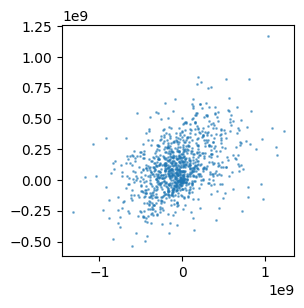

Step: 1000, Loss: 0.26496
Step: 2000, Loss: 0.26074
Step: 3000, Loss: 0.23285
Step: 4000, Loss: 0.29569
Step: 5000, Loss: 0.22934
Step: 6000, Loss: 0.20975
Step: 7000, Loss: 0.29069
Step: 8000, Loss: 0.25279
Step: 9000, Loss: 0.24789
Step: 10000, Loss: 0.24337


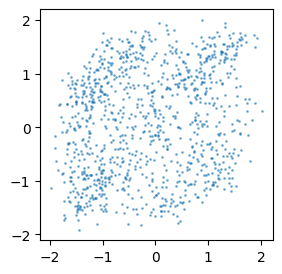

Step: 11000, Loss: 0.20424
Step: 12000, Loss: 0.20669
Step: 13000, Loss: 0.29270
Step: 14000, Loss: 0.27463
Step: 15000, Loss: 0.23594
Step: 16000, Loss: 0.23777
Step: 17000, Loss: 0.25466
Step: 18000, Loss: 0.25459
Step: 19000, Loss: 0.25583
Step: 20000, Loss: 0.24991


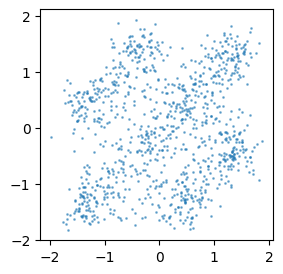

Step: 21000, Loss: 0.18406
Step: 22000, Loss: 0.26406
Step: 23000, Loss: 0.24657
Step: 24000, Loss: 0.27306
Step: 25000, Loss: 0.24839
Step: 26000, Loss: 0.26067
Step: 27000, Loss: 0.28739
Step: 28000, Loss: 0.23969
Step: 29000, Loss: 0.31006
Step: 30000, Loss: 0.25067


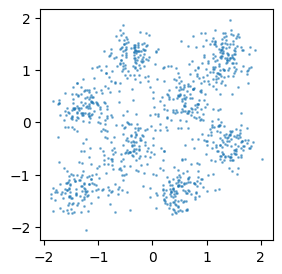

Step: 31000, Loss: 0.24442
Step: 32000, Loss: 0.24602
Step: 33000, Loss: 0.23077
Step: 34000, Loss: 0.28004
Step: 35000, Loss: 0.26290
Step: 36000, Loss: 0.24816
Step: 37000, Loss: 0.22821
Step: 38000, Loss: 0.23078
Step: 39000, Loss: 0.22010
Step: 40000, Loss: 0.26961


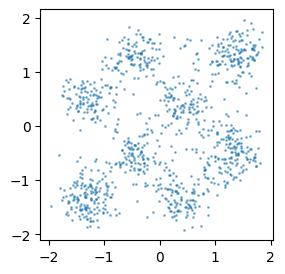

Step: 41000, Loss: 0.20363
Step: 42000, Loss: 0.20735
Step: 43000, Loss: 0.22786
Step: 44000, Loss: 0.23317
Step: 45000, Loss: 0.25255
Step: 46000, Loss: 0.26194
Step: 47000, Loss: 0.23814
Step: 48000, Loss: 0.21923
Step: 49000, Loss: 0.23004
Step: 50000, Loss: 0.25186


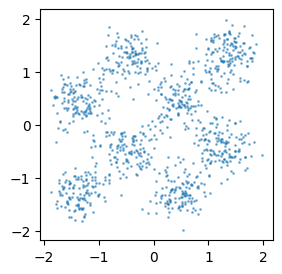

hidden size - 128: mean_loss=0.25171, lowest_loss=0.16412
Step: 0, Loss: 3.26205


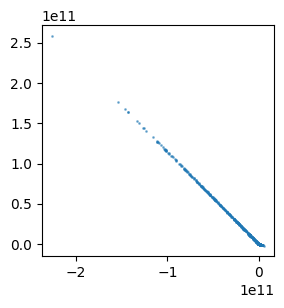

Step: 1000, Loss: 0.30420
Step: 2000, Loss: 0.26999
Step: 3000, Loss: 0.25801
Step: 4000, Loss: 0.26092
Step: 5000, Loss: 0.24700
Step: 6000, Loss: 0.23247
Step: 7000, Loss: 0.26915
Step: 8000, Loss: 0.24236
Step: 9000, Loss: 0.26573
Step: 10000, Loss: 0.23807


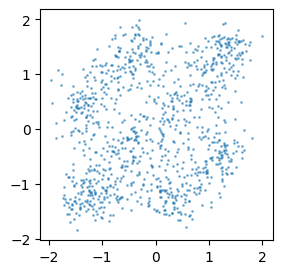

Step: 11000, Loss: 0.28083
Step: 12000, Loss: 0.23447
Step: 13000, Loss: 0.26024
Step: 14000, Loss: 0.25794
Step: 15000, Loss: 0.23980
Step: 16000, Loss: 0.24331
Step: 17000, Loss: 0.24829
Step: 18000, Loss: 0.25339
Step: 19000, Loss: 0.29100
Step: 20000, Loss: 0.26896


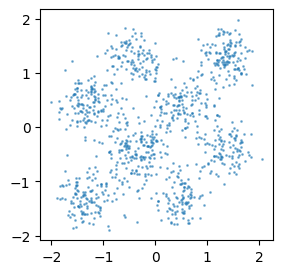

Step: 21000, Loss: 0.21237
Step: 22000, Loss: 0.27017
Step: 23000, Loss: 0.22894
Step: 24000, Loss: 0.29233
Step: 25000, Loss: 0.27646
Step: 26000, Loss: 0.27190
Step: 27000, Loss: 0.24328
Step: 28000, Loss: 0.27124
Step: 29000, Loss: 0.20786
Step: 30000, Loss: 0.31303


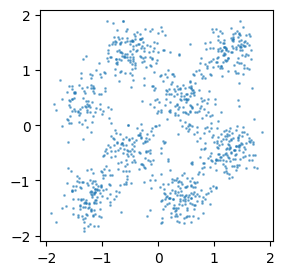

Step: 31000, Loss: 0.23614
Step: 32000, Loss: 0.25826
Step: 33000, Loss: 0.26731
Step: 34000, Loss: 0.24923
Step: 35000, Loss: 0.23436
Step: 36000, Loss: 0.19891
Step: 37000, Loss: 0.29565
Step: 38000, Loss: 0.23049
Step: 39000, Loss: 0.26077
Step: 40000, Loss: 0.27179


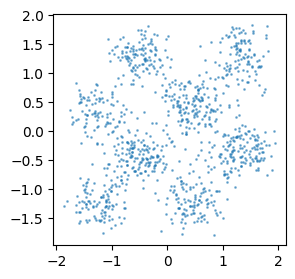

Step: 41000, Loss: 0.24854
Step: 42000, Loss: 0.29405
Step: 43000, Loss: 0.24042
Step: 44000, Loss: 0.23499
Step: 45000, Loss: 0.25242
Step: 46000, Loss: 0.23759
Step: 47000, Loss: 0.22021
Step: 48000, Loss: 0.25101
Step: 49000, Loss: 0.25555
Step: 50000, Loss: 0.25848


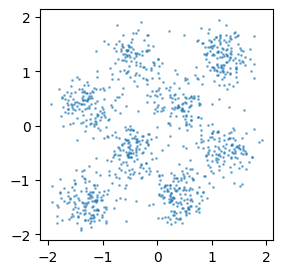

hidden size - 256: mean_loss=0.25032, lowest_loss=0.16283
Step: 0, Loss: 2.98921


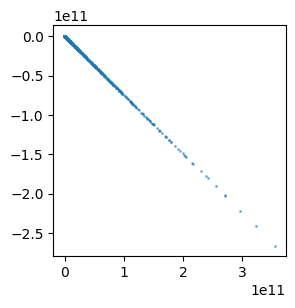

Step: 1000, Loss: 0.26151
Step: 2000, Loss: 0.24580
Step: 3000, Loss: 0.26334
Step: 4000, Loss: 0.25683
Step: 5000, Loss: 0.24545
Step: 6000, Loss: 0.20756
Step: 7000, Loss: 0.24837
Step: 8000, Loss: 0.22705
Step: 9000, Loss: 0.21040
Step: 10000, Loss: 0.24167


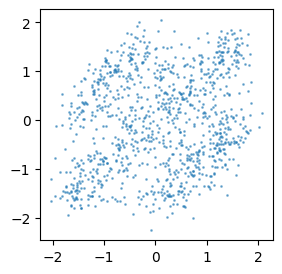

Step: 11000, Loss: 0.24111
Step: 12000, Loss: 0.24965
Step: 13000, Loss: 0.23531
Step: 14000, Loss: 0.24848
Step: 15000, Loss: 0.26583
Step: 16000, Loss: 0.28268
Step: 17000, Loss: 0.28639
Step: 18000, Loss: 0.28378
Step: 19000, Loss: 0.19757
Step: 20000, Loss: 0.25550


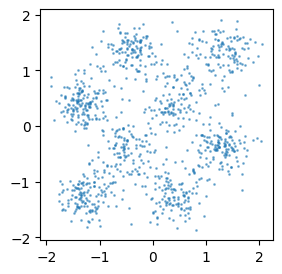

Step: 21000, Loss: 0.21194
Step: 22000, Loss: 0.26358
Step: 23000, Loss: 0.24708
Step: 24000, Loss: 0.20368
Step: 25000, Loss: 0.26860
Step: 26000, Loss: 0.25690
Step: 27000, Loss: 0.29329
Step: 28000, Loss: 0.24005
Step: 29000, Loss: 0.21514
Step: 30000, Loss: 0.26275


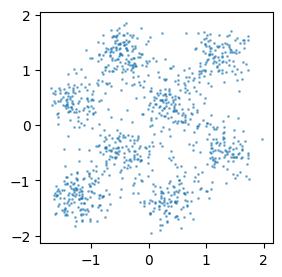

Step: 31000, Loss: 0.22022
Step: 32000, Loss: 0.26588
Step: 33000, Loss: 0.24876
Step: 34000, Loss: 0.25133
Step: 35000, Loss: 0.23729
Step: 36000, Loss: 0.23449
Step: 37000, Loss: 0.22764
Step: 38000, Loss: 0.26261
Step: 39000, Loss: 0.22698
Step: 40000, Loss: 0.21655


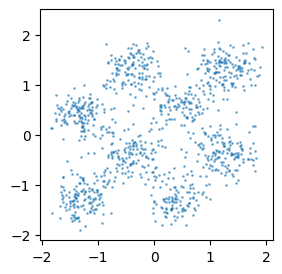

Step: 41000, Loss: 0.26879
Step: 42000, Loss: 0.20817
Step: 43000, Loss: 0.29815
Step: 44000, Loss: 0.26622
Step: 45000, Loss: 0.24975
Step: 46000, Loss: 0.25744
Step: 47000, Loss: 0.28717
Step: 48000, Loss: 0.21786
Step: 49000, Loss: 0.24875
Step: 50000, Loss: 0.23790


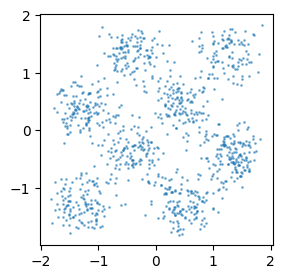

hidden size - 512: mean_loss=0.25083, lowest_loss=0.15752
Step: 0, Loss: 2.77935


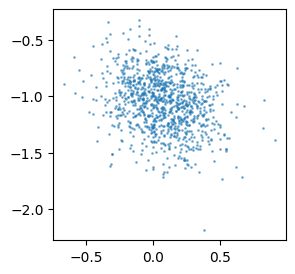

Step: 1000, Loss: 0.27952
Step: 2000, Loss: 0.24511
Step: 3000, Loss: 0.26967
Step: 4000, Loss: 0.28626
Step: 5000, Loss: 0.27373
Step: 6000, Loss: 0.27281
Step: 7000, Loss: 0.22953
Step: 8000, Loss: 0.24546
Step: 9000, Loss: 0.26560
Step: 10000, Loss: 0.26549


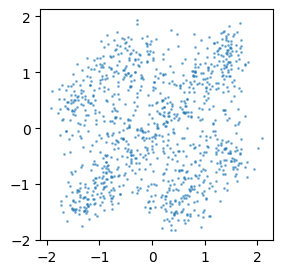

Step: 11000, Loss: 0.23840
Step: 12000, Loss: 0.22983
Step: 13000, Loss: 0.24615
Step: 14000, Loss: 0.25011
Step: 15000, Loss: 0.22205
Step: 16000, Loss: 0.22758
Step: 17000, Loss: 0.24556
Step: 18000, Loss: 0.22486
Step: 19000, Loss: 0.22415
Step: 20000, Loss: 0.25255


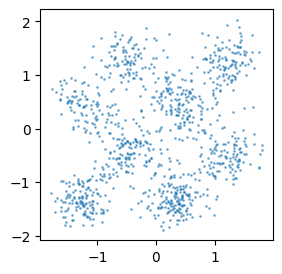

Step: 21000, Loss: 0.22852
Step: 22000, Loss: 0.26910
Step: 23000, Loss: 0.29529
Step: 24000, Loss: 0.23339
Step: 25000, Loss: 0.21076
Step: 26000, Loss: 0.25676
Step: 27000, Loss: 0.27851
Step: 28000, Loss: 0.24386
Step: 29000, Loss: 0.25685
Step: 30000, Loss: 0.23438


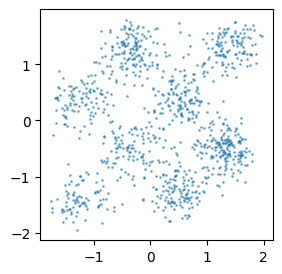

Step: 31000, Loss: 0.26547
Step: 32000, Loss: 0.22796
Step: 33000, Loss: 0.22492
Step: 34000, Loss: 0.28064
Step: 35000, Loss: 0.24829
Step: 36000, Loss: 0.24833
Step: 37000, Loss: 0.23094
Step: 38000, Loss: 0.23435
Step: 39000, Loss: 0.24680
Step: 40000, Loss: 0.29849


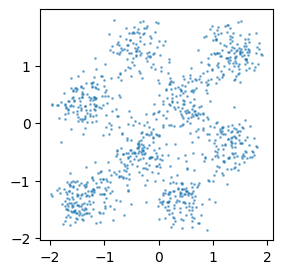

Step: 41000, Loss: 0.27709
Step: 42000, Loss: 0.23327
Step: 43000, Loss: 0.25093
Step: 44000, Loss: 0.23790
Step: 45000, Loss: 0.23491
Step: 46000, Loss: 0.29331
Step: 47000, Loss: 0.20924
Step: 48000, Loss: 0.27136
Step: 49000, Loss: 0.27872
Step: 50000, Loss: 0.26496


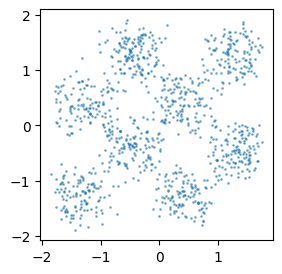

hidden size - 1028: mean_loss=0.25209, lowest_loss=0.16276


In [79]:
hidden_sizes = [128, 256, 512, 1028]
training_steps = 50000
BATCH_SIZE=1024
#######################################

for hs in hidden_sizes:

  #modify hidden_size parameter in config class
  net_config = NetConfig()
  net_config.resnet_n_hidden = hs
  net_config.time_embedding_dim= hs

  #initialize model
  diffusion_process = DiscreteDDPMProcess(num_diffusion_timesteps=ts)
  time_sampler = UniformDiscreteTimeSampler(diffusion_process.tmin, diffusion_process.tmax)
  model = DiffusionModel(diffusion_process, time_sampler, net_config=net_config, data_shape=(2,)).to(device)
  optimizer = optim.Adam(model.parameters(), lr=3e-4)

  losses = []
  for step in range(training_steps+1):
      #generate batch on the fly
      train_data = generate_batch(BATCH_SIZE)
      x = torch.Tensor(train_data).to(device)
      optimizer.zero_grad()
      loss = model.loss(x)
      loss.backward()
      optimizer.step()

      losses.append(loss)

      if step % 1000 == 0:
          print(f'Step: {step}, Loss: {loss:.5f}')

      if step % 10000 == 0:
          with torch.no_grad():
              samples = model.sample(x, BATCH_SIZE) # create new samples
          plt.figure(figsize=(3, 3))
          plt.scatter(samples[:, 0].cpu(), samples[:, 1].cpu(), s=1, alpha=0.5)
          plt.show()

  min_loss = torch.min(torch.stack(losses)).item()
  mean_loss = torch.mean(torch.stack(losses)).item()
  print(f'hidden size - {hs}: mean_loss={mean_loss:.5f}, lowest_loss={min_loss:.5f}')

##### Conclusion on experiments

> Ablation experiments: for constant learning rate: the 0.0003 performs the best with loss = 0.384 among all learning_rates = [3e-3, 3e-4, 3e-5, 3e-6]. Too small lr means it converges slower and might stuck in a local optimal thus not as good as 0.0003.For number of time steps, the loss decreases as number of timesteps increases, since now $x_t$ and $x_{t-1}$ are closer and easier to denoise. The optimal number is 4000 with loss of 0.160 among [1000, 2000, 3000, 4000]. For hidden size, the optimal hidden dimension is 512 with loss of 0.157 among [128, 256, 512, 1028]

#### Generation/Sampling

**Q.27  Generate samples and plot them at different timestep of the chain. Check how real & synthetic distribution overlap, compare the densities**

In [71]:
def plot_sample_per_timestep(model, x0, sample_size):

    with torch.no_grad():

        x = torch.randn((sample_size,) + model._data_shape, device=x0.device) #sample pure noise
        T = model._process._num_diffusion_timesteps - 1

        for _ in range(T):
          x = model._reverse_process_step(x, T)[1]
          T -= 1

          if T % 50 == 0:
            plt.figure(figsize=(3, 3))
            plt.scatter(x[:, 0].cpu(), x[:, 1].cpu(), s=1, alpha=0.5)
            plt.show()

    return x

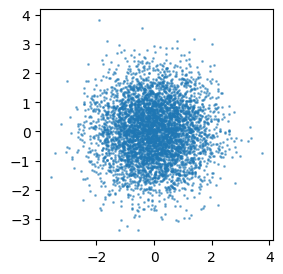

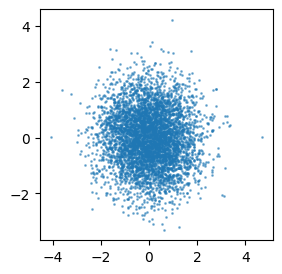

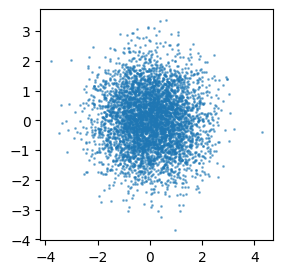

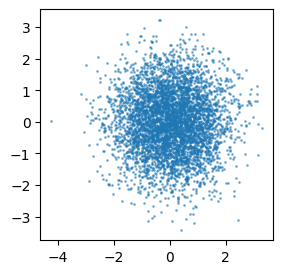

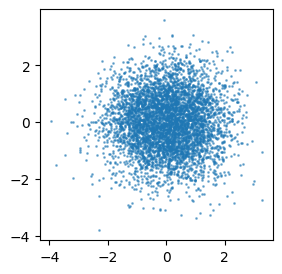

...

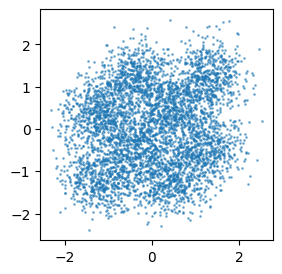

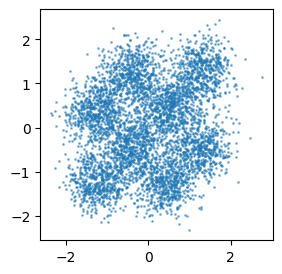

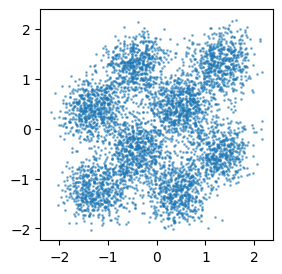

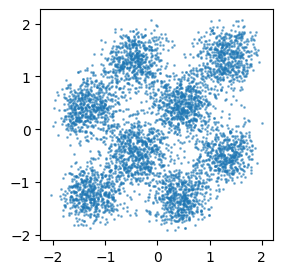

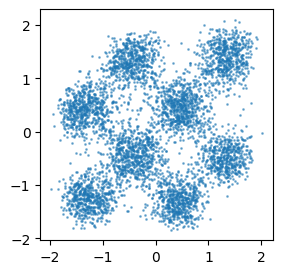

In [72]:
BATCH_SIZE = 5000
test_data = generate_batch(BATCH_SIZE)
test_x = torch.Tensor(test_data).to(device)
samples = plot_sample_per_timestep(model, test_x, BATCH_SIZE)

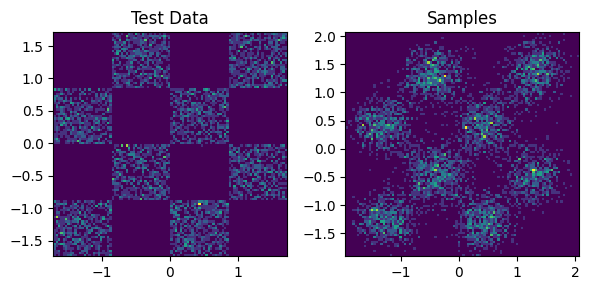

In [70]:
plt.figure(figsize=(6, 3))

plt.subplot(1, 2, 1)
plt.hist2d(test_data.numpy()[:, 0], test_data.numpy()[:, 1], bins=100)
plt.title('Test Data')

plt.subplot(1, 2, 2)
plt.hist2d(samples.cpu().numpy()[:, 0], samples.cpu().numpy()[:, 1], bins=100)
plt.title('Samples')

plt.tight_layout()
plt.show()

---
### Conclusion

**Q.28: As a conclusion, how would you compare the advantages and shortcomings of GANs, VAEs, Normalizing flows and Denoising Models ?**

**Variational Autoencoders (VAEs):**

VAEs learn a latent space representation of the input data, enabling them to capture meaningful features and variations present in the data. Moreover, VAEs are built upon a probabilistic framework, enabling them to model uncertainty in the data and generate probabilistic outputs. VAEs autoencoder design allows encoder to learn complex distribution and approximate the true posterior distribution, while decoder could learn how to reconstruct data from latent space and generate good data that closely resembles the original.

However, this encoder-decoder design requires a good balance between them. If the encoder dominates decoder, it might undermine the ability to learn for decoder by producing less informative latent space. The other way around, if decoder is too powerful, it might ignore the latent space and reconstruct data too easily, leading to mode collapse, that model fails to capture the full diversity of the data distribution and instead focuses on a few dominant modes.

**Denoising Diffusion Models:**

Denoising models has robustness to noise, as they are specifically designed to remove noise from input data, making them effective in scenarios involving corrupted inputs. Additionally, denoising models often feature simpler architectures compared to VAEs, making them easier to train and deploy in practice, resulting in faster training times and lower computational requirements.

One notable drawback of denoising models is their limited generalization, as denoising models are typically trained on specific types of corruption patterns, which may hinder their ability to generalize to unseen noise types or levels. They may also struggle when the noise level is high or when the noise characteristics are complex. Additionally, denoising models may inadvertently remove useful information along with the noise, particularly if the noise is similar in nature to the underlying signal, resulting in the loss of important details or features in the data. Furthermore, designing effective loss functions and training procedures for denoising models can be complicated (since we only use simplified version of loss), especially when dealing with complex noise distributions.